In [1]:
import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

!conda install lxml --yes # library to scrape data from webpages 

import numpy as np # library to handle data in a vectorized manner
import json # library to handle JSON files

!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

import matplotlib.cm as cm # import Matplotlib and associated plotting modules
import matplotlib.colors as colors
import matplotlib.pyplot as plt

from sklearn.cluster import KMeans # import k-means from clustering stage

!conda install -c conda-forge folium=0.5.0 --yes 
import folium # map rendering library
from folium import plugins

print('Libraries imported.')

Solving environment: done

## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs:
    - lxml


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    ca-certificates-2021.1.19  |       h06a4308_0         121 KB
    certifi-2020.12.5          |   py36h06a4308_0         140 KB
    libxml2-2.9.10             |       hb55368b_3         1.2 MB
    libxslt-1.1.34             |       hc22bd24_0         432 KB
    lxml-4.6.2                 |   py36h9120a33_0         1.2 MB
    openssl-1.1.1j             |       h27cfd23_0         2.5 MB
    ------------------------------------------------------------
                                           Total:         5.6 MB

The following NEW packages will be INSTALLED:

  libxslt            pkgs/main/linux-64::libxslt-1.1.34-hc22bd24_0
  lxml               pkgs/main/linux-64::lxml-4.6.2-py36h9120a33_0

The foll

## Import Neighbourhoods and MLS Districts Mapping

In [2]:
hood_dist=pd.read_csv('Neighbourhoods_MLS_Districts.csv')
print('Number of Toronto City Neighbourhoods: {}'.format(hood_dist.shape[0]))
hood_dist.head()

Number of Toronto City Neighbourhoods: 140


,Neighbourhood,Hood_ID,MLS_District
0,Yonge-St.Clair,97,Toronto C02
1,York University Heights,27,Toronto W05
2,Lansing-Westgate,38,Toronto C07
3,Yorkdale-Glen Park,31,Toronto W04
4,Stonegate-Queensway,16,Toronto W07


## Import MLS House Price Data

In [5]:
df=pd.read_csv('MLS.csv')
mls_all=df
mls_20=df[df['Date']=='2020-12-01'] #only extract the latest data
mls_20.shape

(73, 17)

In [7]:
# extract housing type index and benchmark price
mls_dtl=mls_20[['Location','SFDetachIndex','SFDetachBenchmark','SFAttachIndex','SFAttachBenchmark','THouseIndex','THouseBenchmark','ApartIndex','ApartBenchmark']]

# Drop NaN records
sf_detach_index = mls_20[['SFDetachIndex']].dropna(subset=["SFDetachIndex"], axis=0)
sf_detach_bench = mls_20[['SFDetachBenchmark']].dropna(subset=["SFDetachBenchmark"], axis=0)
print('Number of Single Family Detached records: {}'.format(sf_detach_index.shape[0]))

sf_attach_index = mls_20[['SFAttachIndex']].dropna(subset=["SFAttachIndex"], axis=0)
sf_attach_bench = mls_20[['SFAttachBenchmark']].dropna(subset=["SFAttachBenchmark"], axis=0)
print('Number of Single Family Attached records: {}'.format(sf_attach_index.shape[0]))

thouse_index = mls_20[['THouseIndex']].dropna(subset=["THouseIndex"], axis=0)
thouse_bench = mls_20[['THouseBenchmark']].dropna(subset=["THouseBenchmark"], axis=0)
print('Number of Townhouse records: {}'.format(thouse_index.shape[0]))

apart_index = mls_20[['ApartIndex']].dropna(subset=["ApartIndex"], axis=0)
apart_bench = mls_20[['ApartBenchmark']].dropna(subset=["ApartBenchmark"], axis=0)
print('Number of Apartment records: {}'.format(apart_bench.shape[0]))

sf_detach_bench.head()

Number of Single Family Detached records: 72
Number of Single Family Attached records: 71
Number of Townhouse records: 54
Number of Apartment records: 60


,SFDetachBenchmark
65,882600.0
131,793800.0
197,1100500.0
275,810200.0
341,874100.0


In [8]:
# extract composite index and benchmark price
mls=mls_20[['Location','CompBenchmark','CompIndex']]
print('Number of MLS records: {}'.format(mls.shape[0]))
mls.head()

Number of MLS records: 73


,Location,CompBenchmark,CompIndex
65,Adjala-Tosorontio,879000.0,292.1
131,Ajax,738500.0,299.7
197,Aurora,961300.0,291.3
209,Barrie,NaN,NaN
275,Bradford West Gwillimbury,774900.0,318.0


## Join Neighbourhood and MLS House Price 

In [10]:
# Join Neighbourhood and MLS House Price
hood_mls=hood_dist.join(mls.set_index('Location'), on='MLS_District')

# Drop NaN records
hood_mls.dropna(subset=["CompIndex"], axis=0, inplace=True)
hood_mls.shape
hood_mls = hood_mls.reset_index(drop=True)

print('Number of Toronto City Neighbourhoods: {}'.format(hood_mls.shape[0]))
hood_mls.head(20)

Number of Toronto City Neighbourhoods: 138


,Neighbourhood,Hood_ID,MLS_District,CompBenchmark,CompIndex
0,Yonge-St.Clair,97,Toronto C02,1413700.0,293.8
1,York University Heights,27,Toronto W05,684600.0,288.3
2,Lansing-Westgate,38,Toronto C07,958300.0,277.0
3,Yorkdale-Glen Park,31,Toronto W04,817400.0,318.8
4,Stonegate-Queensway,16,Toronto W07,1151700.0,269.1
5,Tam O'Shanter-Sullivan,118,Toronto E05,753800.0,287.3
6,The Beaches,63,Toronto E02,1179300.0,314.9
7,Thistletown-Beaumond Heights,3,Toronto W10,707000.0,311.3
8,Thorncliffe Park,55,Toronto C11,1053000.0,297.4
9,Danforth East York,59,Toronto E01,1167500.0,374.9


## Create Listing of Toronto City Postal Codes and Geocodes

In [11]:
# Import Toronto Postal Code 
df = pd.read_html('https://en.wikipedia.org/wiki/List_of_postal_codes_of_Canada:_M', header=0)
canada_data=df[0]
canada_data.drop(canada_data[canada_data.Borough == 'Not assigned'].index, inplace=True)
canada_data = canada_data.reset_index(drop=True)
canada_data.head()

# Merge Postal Code and Geocodes
geocode=pd.read_csv('Geospatial_Coordinates.csv') 
canada_geo = pd.merge(canada_data, geocode, on='Postal Code')
print('Number of Toronto City Postal Codes: {}'.format(canada_geo.shape[0]))

# Filter listing for only the neighbourhoods within Toronto City
#canada_geo['Borough'].unique()
toronto_geo = canada_geo
#toronto_geo = canada_geo[(canada_geo['Borough'] == 'Downtown Toronto') | (canada_geo['Borough'] == 'Central Toronto') | (canada_geo['Borough'] == 'West Toronto')  | (canada_geo['Borough'] == 'East Toronto')].reset_index(drop=True)
#print('Number of Toronto City neighbourhood groups: {}'.format(toronto_geo.shape[0]))
toronto_geo.describe(include='all')

Number of Toronto City Postal Codes: 103


,Postal Code,Borough,Neighbourhood,Latitude,Longitude
count,103,103,103,103.000000,103.000000
unique,103,10,99,NaN,NaN
top,M4G,North York,Downsview,NaN,NaN
freq,1,24,4,NaN,NaN
mean,NaN,NaN,NaN,43.704608,-79.397153
std,NaN,NaN,NaN,0.052463,0.097146
min,NaN,NaN,NaN,43.602414,-79.615819
25%,NaN,NaN,NaN,43.660567,-79.464763
50%,NaN,NaN,NaN,43.696948,-79.388790
75%,NaN,NaN,NaN,43.745320,-79.340923


In [12]:
toronto_geo[['Postal Code','Neighbourhood','Latitude','Longitude']].head(10)

,Postal Code,Neighbourhood,Latitude,Longitude
0,M3A,Parkwoods,43.753259,-79.329656
1,M4A,Victoria Village,43.725882,-79.315572
2,M5A,"Regent Park, Harbourfront",43.654260,-79.360636
3,M6A,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763
4,M7A,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494
5,M9A,"Islington Avenue, Humber Valley Village",43.667856,-79.532242
6,M1B,"Malvern, Rouge",43.806686,-79.194353
7,M3B,Don Mills,43.745906,-79.352188
8,M4B,"Parkview Hill, Woodbine Gardens",43.706397,-79.309937
9,M5B,"Garden District, Ryerson",43.657162,-79.378937


In [13]:
toronto_geo[toronto_geo['Neighbourhood']=='Downsview']

,Postal Code,Borough,Neighbourhood,Latitude,Longitude
40,M3K,North York,Downsview,43.737473,-79.464763
46,M3L,North York,Downsview,43.739015,-79.506944
53,M3M,North York,Downsview,43.728496,-79.495697
60,M3N,North York,Downsview,43.761631,-79.520999


Note that neighbourhood Downsview has 4 postal codes.

## Import Neighbourhood Geojson

In [14]:
# Get the dataset metadata by passing package_id to the package_search endpoint
# For example, to retrieve the metadata for this dataset:
 
url = "https://ckan0.cf.opendata.inter.prod-toronto.ca/api/3/action/package_show"
params = { "id": "4def3f65-2a65-4a4f-83c4-b2a4aed72d46"}
package = requests.get(url, params = params).json()
#print(package["result"])
for idx, resource in enumerate(package["result"]["resources"]):
    if resource["datastore_active"]:
        url = "https://ckan0.cf.opendata.inter.prod-toronto.ca/api/3/action/datastore_search"
        p = { "id": resource["id"] }
        data = requests.get(url, params = p).json()
        #print(data)
        df = pd.DataFrame(data["result"]["records"])
        break
print('Number of Toronto City Neighbourhoods Geo : {}'.format(df.shape[0]))
df.head()

Number of Toronto City Neighbourhoods Geo : 100


,_id,AREA_ID,AREA_ATTR_ID,PARENT_AREA_ID,AREA_SHORT_CODE,AREA_LONG_CODE,AREA_NAME,AREA_DESC,X,Y,LONGITUDE,LATITUDE,OBJECTID,Shape__Area,Shape__Length,geometry,CLASSIFICATION,CLASSIFICATION_CODE
0,11061,2480141,26005521,None,096,096,Casa Loma (96),Casa Loma (96),None,None,None,None,17545105,3.678385e+06,8214.176485,"{""type"": ""Polygon"", ""coordinates"": [[[-79.4146...",None,None
1,11062,2480140,26005520,None,095,095,Annex (95),Annex (95),None,None,None,None,17545121,5.337192e+06,10513.883143,"{""type"": ""Polygon"", ""coordinates"": [[[-79.3941...",None,None
2,11063,2480139,26005519,None,109,109,Caledonia-Fairbank (109),Caledonia-Fairbank (109),None,None,None,None,17545137,2.955857e+06,6849.911724,"{""type"": ""Polygon"", ""coordinates"": [[[-79.4602...",None,None
3,11064,2480064,26005444,None,064,064,Woodbine Corridor (64),Woodbine Corridor (64),None,None,None,None,17545153,3.052518e+06,7512.966773,"{""type"": ""Polygon"", ""coordinates"": [[[-79.3148...",None,None
4,11065,2480063,26005443,None,103,103,Lawrence Park South (103),Lawrence Park South (103),None,None,None,None,17545169,6.211341e+06,13530.370002,"{""type"": ""Polygon"", ""coordinates"": [[[-79.4109...",None,None


## Creating Neighbourhood Geometry Listing

In [15]:
neighbourhood_geo = pd.DataFrame(columns=['Hood_ID','Latitude','Longitude'])

for geo, hood, name in zip(df['geometry'], df['AREA_SHORT_CODE'], df['AREA_NAME']):
    ll=json.loads(geo)
    lng=ll['coordinates'][0][0][0]
    lat=ll['coordinates'][0][0][1]
    #print('{} coordinates are: {} , {}'.format(name, lat, lon))

    neighbourhood_geo = neighbourhood_geo.append({'Hood_ID':int(hood), 'Latitude':lat, 'Longitude':lng}, ignore_index=True)

print('n_geo table size is {}'.format(neighbourhood_geo.shape))
neighbourhood_geo.head()

n_geo table size is (100, 3)


,Hood_ID,Latitude,Longitude
0,96.0,43.673910,-79.414693
1,95.0,43.668720,-79.394141
2,109.0,43.681558,-79.460210
3,64.0,43.666740,-79.314851
4,103.0,43.704083,-79.410958


## Get Toronto Latitude & Longitude

In [16]:
address = 'Toronto, Canada'

geolocator = Nominatim(user_agent="foursquare_explorer")
location = geolocator.geocode(address)
latitude = location.latitude+0.07
longitude = location.longitude
print('The geograpical coordinate of Toronto are {}, {}.'.format(latitude, longitude))

tjson=r'Neighbourhoods.geojson'

The geograpical coordinate of Toronto are 43.7234817, -79.3839347.


## Price Range by House Types

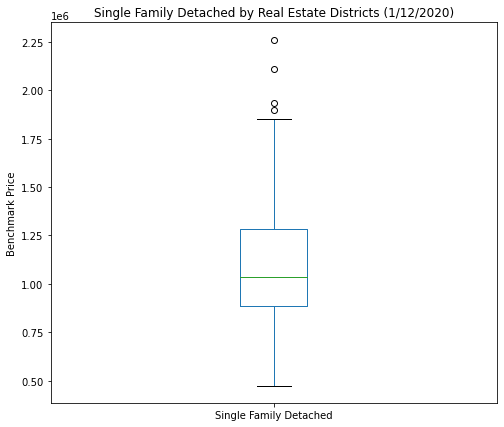

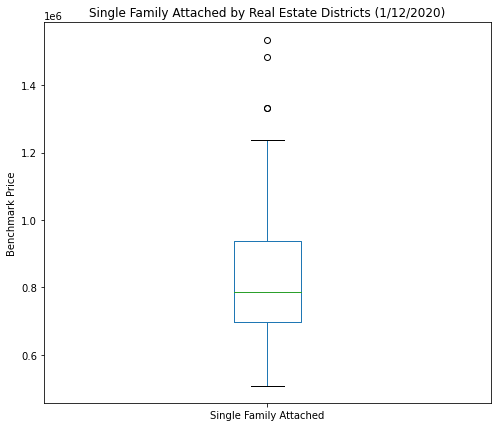

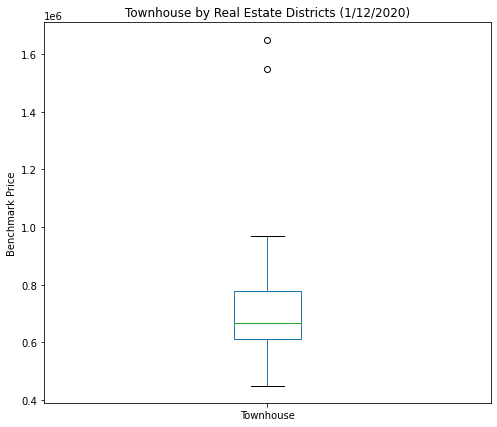

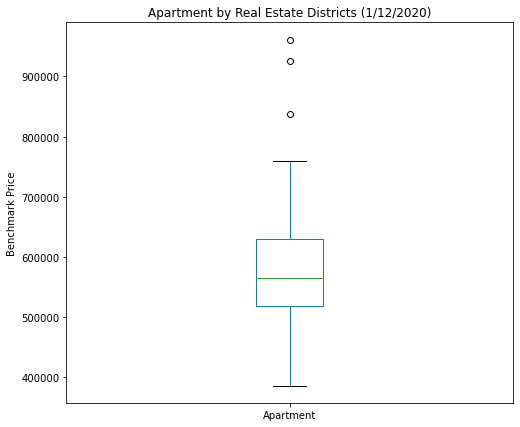

,Single Family Detached
65,882600.0
131,793800.0
197,1100500.0
275,810200.0
341,874100.0


In [178]:
# use box plot to depict price range of each house type
sf_detach_bench.rename(columns={'SFDetachBenchmark':'Single Family Detached'}, inplace=True)
sf_detach_bench.plot(kind='box', figsize=(8, 7))
plt.title('Single Family Detached by Real Estate Districts (1/12/2020)')
plt.ylabel('Benchmark Price')
plt.show()

sf_attach_bench.rename(columns={'SFAttachBenchmark':'Single Family Attached'}, inplace=True)
sf_attach_bench.plot(kind='box', figsize=(8, 7))
plt.title('Single Family Attached by Real Estate Districts (1/12/2020)')
plt.ylabel('Benchmark Price')
plt.show()

thouse_bench.rename(columns={'THouseBenchmark':'Townhouse'}, inplace=True)
thouse_bench.plot(kind='box', figsize=(8, 7))
plt.title('Townhouse by Real Estate Districts (1/12/2020)')
plt.ylabel('Benchmark Price')
plt.show()

apart_bench.rename(columns={'ApartBenchmark':'Apartment'}, inplace=True)
apart_bench.plot(kind='box', figsize=(8, 7))
plt.title('Apartment by Real Estate Districts (1/12/2020)')
plt.ylabel('Benchmark Price')
plt.show()

sf_detach_bench.head()

## House Price Change from 2015 to 2020

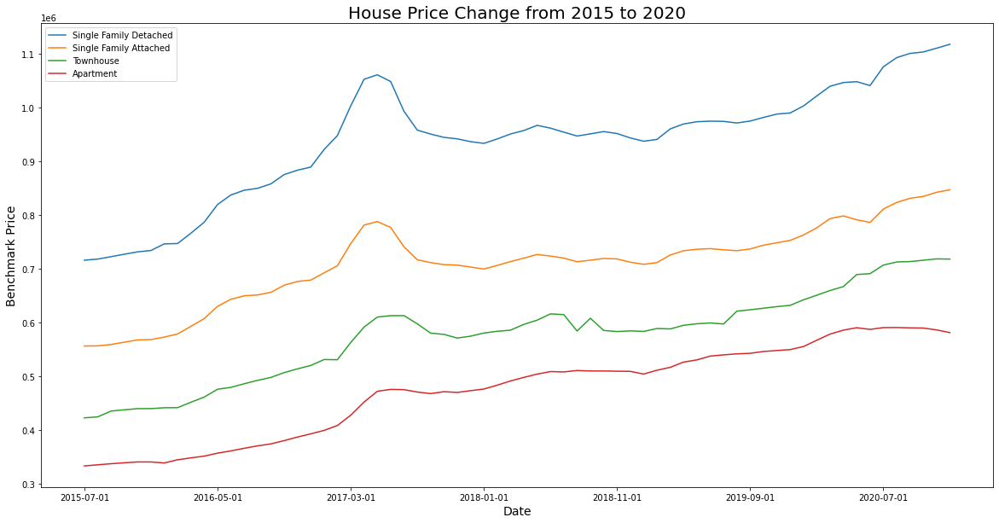

,Single Family Detached,Single Family Attached,Townhouse,Apartment
Date,,,,
2015-07-01,716154.0,556522.0,422884.0,333449.0
2015-08-01,718265.0,556781.0,424680.0,335517.0
2015-09-01,722707.0,559338.0,435485.0,337545.0
2015-10-01,727285.0,563633.0,437844.0,339249.0
2015-11-01,731715.0,567835.0,440031.0,340874.0


In [134]:
### use line chart to depict price trend of each house type
mls_his=mls_all[['Date','SFDetachBenchmark','SFAttachBenchmark','THouseBenchmark','ApartBenchmark']].groupby('Date').mean()
mls_his=mls_his.round({'SFDetachBenchmark':0,'SFAttachBenchmark':0,'THouseBenchmark':0,'ApartBenchmark':0})
mls_his.rename(columns={'SFDetachBenchmark':'Single Family Detached','SFAttachBenchmark':'Single Family Attached','THouseBenchmark':'Townhouse','ApartBenchmark':'Apartment'}, inplace=True)
#mls_his.set_index('Date', inplace=True)

#mls_his.index = mls_his.index.map(str) # let's change the index values of df_CI to type integer for plotting
mls_his.plot(kind='line', figsize=(20, 10))

plt.title('House Price Change from 2015 to 2020', fontsize = 20)
plt.ylabel('Benchmark Price', fontsize=14)
plt.xlabel('Date', fontsize=14)
plt.show()

mls_his.head()

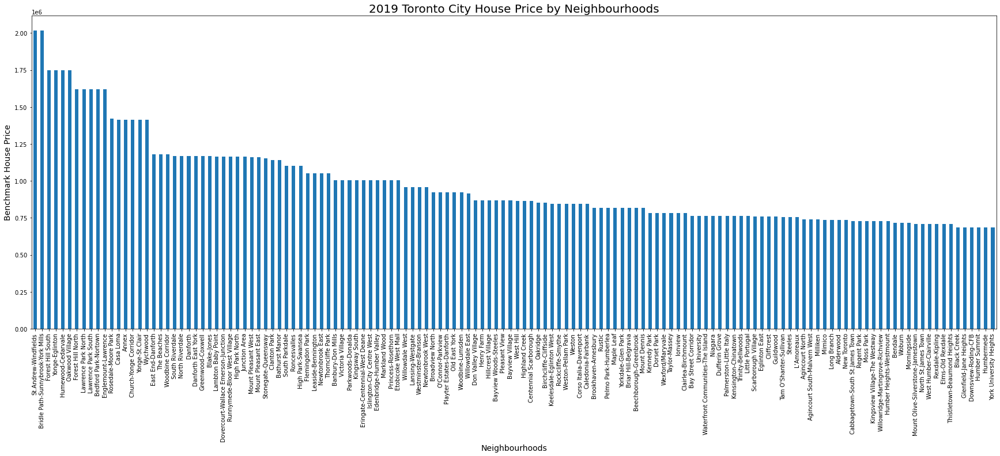

,Location,CompBenchmark,CompIndex
65,Adjala-Tosorontio,879000.0,292.1
131,Ajax,738500.0,299.7
197,Aurora,961300.0,291.3
209,Barrie,NaN,NaN
275,Bradford West Gwillimbury,774900.0,318.0
341,Brampton,780800.0,306.3
407,Brock,471200.0,272.1
473,Burlington,931800.0,336.0
539,Caledon,979000.0,266.6
670,City of Toronto,952400.0,293.7


In [174]:
# plot bar chart to visualize neighbourhoods house price
mls_price = hood_mls[['Neighbourhood','CompBenchmark']].sort_values(by='CompBenchmark', ascending=False)
mls_price.set_index('Neighbourhood', inplace=True)
mls_plt = mls_price['CompBenchmark']
mls_plt.plot(kind='bar', figsize=(30, 10))
plt.xlabel('Neighbourhoods', fontsize = 14) # add to x-label to the plot
plt.ylabel('Benchmark House Price', fontsize = 14) # add y-label to the plot
plt.title('2019 Toronto City House Price by Neighbourhoods', fontsize = 20) # add title to the plot

plt.show()

mls.head()

## Create Choropleth Map by Toronto City Composite House Price Index

In [44]:
#Top 10 by HPI
print('To 10 by HPI {}'.format(hood_mls.sort_values(by=['CompIndex'],ascending=False).head(10)['Neighbourhood'].tolist()))
hood_mls.sort_values(by=['CompIndex'],ascending=False).head(10)

To 10 by HPI ['Blake-Jones', 'Greenwood-Coxwell', 'Danforth', 'Danforth East York', 'South Riverdale', 'North Riverdale', 'Humewood-Cedarvale', 'Yonge-Eglinton', 'Oakwood Village', 'Forest Hill South']


,Neighbourhood,Hood_ID,MLS_District,CompBenchmark,CompIndex
101,Blake-Jones,69,Toronto E01,1167500.0,374.9
35,Greenwood-Coxwell,65,Toronto E01,1167500.0,374.9
12,Danforth,66,Toronto E01,1167500.0,374.9
9,Danforth East York,59,Toronto E01,1167500.0,374.9
16,South Riverdale,70,Toronto E01,1167500.0,374.9
31,North Riverdale,68,Toronto E01,1167500.0,374.9
10,Humewood-Cedarvale,106,Toronto C03,1748600.0,334.8
126,Yonge-Eglinton,100,Toronto C03,1748600.0,334.8
75,Oakwood Village,107,Toronto C03,1748600.0,334.8
54,Forest Hill South,101,Toronto C03,1748600.0,334.8


In [356]:
# Create a numpy array of length 6 and has linear spacing from the minium house price to the maximum house price
threshold_scale = np.linspace(hood_mls['CompIndex'].min(),
                              hood_mls['CompIndex'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # Change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # Make sure that the last value of the list is greater than the maximum house price
print('House price index threshold {}'.format(threshold_scale))

# Create choropleth map for Toronto City house price
hpi_tmap = folium.Map(location=[latitude, longitude], zoom_start=11, tiles='Stamen Toner')#'CartoDB Positron'))
hpi_tmap.choropleth(
    geo_data=tjson,
    data=hood_mls,
    columns=['Hood_ID', 'CompIndex'],
    key_on='feature.properties.AREA_SHORT_CODE',
   threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.5, 
    line_opacity=0.2,
    legend_name='Toronto City House Price Index',
    reset=True
)

hpi_tmap

House price index threshold [200, 234, 269, 304, 339, 375]


## Create Choropleth Map by Toronto City Composite House Price Benchmark

In [46]:
#Top 10 by house price
print('House price range from {} to {}'.format(hood_mls['CompBenchmark'].min(), hood_mls['CompBenchmark'].max()))
print('To 10 by Benchmark Price {}'.format(hood_mls.sort_values(by=['CompBenchmark'],ascending=False).head(10)['Neighbourhood'].tolist()))
hood_mls.sort_values(by=['CompBenchmark'],ascending=False).head(10)

House price range from 684600.0 to 2016100.0
To 10 by Benchmark Price ['St.Andrew-Windfields', 'Bridle Path-Sunnybrook-York Mills', 'Forest Hill South', 'Yonge-Eglinton', 'Humewood-Cedarvale', 'Oakwood Village', 'Forest Hill North', 'Lawrence Park North', 'Lawrence Park South', 'Bedford Park-Nortown']


,Neighbourhood,Hood_ID,MLS_District,CompBenchmark,CompIndex
17,St.Andrew-Windfields,40,Toronto C12,2016100.0,236.3
115,Bridle Path-Sunnybrook-York Mills,41,Toronto C12,2016100.0,236.3
54,Forest Hill South,101,Toronto C03,1748600.0,334.8
126,Yonge-Eglinton,100,Toronto C03,1748600.0,334.8
10,Humewood-Cedarvale,106,Toronto C03,1748600.0,334.8
75,Oakwood Village,107,Toronto C03,1748600.0,334.8
33,Forest Hill North,102,Toronto C04,1617800.0,259.9
125,Lawrence Park North,105,Toronto C04,1617800.0,259.9
118,Lawrence Park South,103,Toronto C04,1617800.0,259.9
113,Bedford Park-Nortown,39,Toronto C04,1617800.0,259.9


In [357]:
# Create a numpy array of length 6 and has linear spacing from the minium total house price to the maximum house price
threshold_scale = np.linspace(hood_mls['CompBenchmark'].min(),
                              hood_mls['CompBenchmark'].max(),
                              6, dtype=int)
threshold_scale = threshold_scale.tolist() # Change the numpy array to a list
threshold_scale[-1] = threshold_scale[-1] + 1 # Make sure that the last value of the list is greater than the maximum house price

print('House price threshold {}'.format(threshold_scale))

# Create choropleth map for Toronto City house price
hp_tmap = folium.Map(location=[latitude, longitude], zoom_start=11, tiles='Stamen Toner')
hp_tmap.choropleth(
    geo_data=tjson,
    data=hood_mls,
    columns=['Hood_ID', 'CompBenchmark'],
    key_on='feature.properties.AREA_SHORT_CODE',
   threshold_scale=threshold_scale,
    fill_color='YlOrRd', 
    fill_opacity=0.5, 
    line_opacity=0.2,
    legend_name='Toronto City House Price',
    reset=True
)
hp_tmap

House price threshold [684600, 950900, 1217200, 1483500, 1749800, 2016101]


## Import 2019 Crime Rate Data

In [48]:
# import data and calculate 2019 total crime rate per neighbourhood
crime=pd.read_csv('Neighbourhood_Crime_Rates.csv') 
crime=crime[['Neighbourhood','Hood_ID','Population','Assault_Rate_2019','AutoTheft_Rate_2019','BreakandEnter_Rate_2019','Homicide_Rate_2019','Robbery_Rate_2019','TheftOver_Rate_2019']]
crime.loc[:,'Total_Crime_Rate_2019']=crime.loc[:,['Assault_Rate_2019','AutoTheft_Rate_2019','BreakandEnter_Rate_2019','Homicide_Rate_2019','Robbery_Rate_2019','TheftOver_Rate_2019']].sum(axis=1)
crime.head()

,Neighbourhood,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Total_Crime_Rate_2019
0,Yonge-St.Clair,97,12528,295.3,47.9,223.5,0.0,31.9,47.9,646.5
1,York University Heights,27,27593,1340.9,521.9,391.4,0.0,286.3,101.5,2642.0
2,Lansing-Westgate,38,16164,445.4,198.0,241.3,0.0,68.1,68.1,1020.9
3,Yorkdale-Glen Park,31,14804,1411.8,412.1,567.4,6.8,283.7,195.9,2877.7
4,Stonegate-Queensway,16,25051,327.3,135.7,255.5,0.0,87.8,16.0,822.3


In [49]:
# sort to review crime rates of neighbourhoods
crime_sorted=crime.sort_values(by=['Total_Crime_Rate_2019'],ascending=False)
print('Crime rate table shape: {}'.format(crime_sorted.shape))
crime_sorted.head(15)

Crime rate table shape: (140, 10)


,Neighbourhood,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Total_Crime_Rate_2019
93,Bay Street Corridor,76,25797,3550.8,193.8,798.5,11.6,476.8,283.0,5314.5
131,Moss Park,73,20506,3106.4,229.2,1141.1,14.6,668.1,121.9,5281.3
22,Church-Yonge Corridor,75,31340,2804.7,172.3,966.8,3.2,456.3,134.0,4537.3
51,Kensington-Chinatown,78,17945,2078.6,217.3,1549.2,0.0,256.3,206.2,4307.6
60,University,79,7607,1630.1,118.3,1196.3,13.1,157.7,78.9,3194.4
41,West Humber-Clairville,1,33312,795.5,1446.9,396.3,6.0,210.1,189.1,3043.9
19,Humber Summit,21,12416,950.4,1087.3,459.1,24.2,225.5,177.2,2923.7
3,Yorkdale-Glen Park,31,14804,1411.8,412.1,567.4,6.8,283.7,195.9,2877.7
1,York University Heights,27,27593,1340.9,521.9,391.4,0.0,286.3,101.5,2642.0
87,Regent Park,72,10803,1444.0,194.4,601.7,9.3,129.6,46.3,2425.3


In [51]:
crime.describe(include='all')

,Neighbourhood,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Total_Crime_Rate_2019
count,140,140.0000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000,140.000000
unique,140,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Mount Dennis,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,70.5000,19511.221429,714.346429,185.565000,305.550714,2.987143,122.813571,47.132143,1378.395000
std,NaN,40.5586,10033.589222,498.301136,169.631765,216.778588,4.812197,86.312788,41.478434,797.675784
min,NaN,1.0000,6577.000000,161.100000,26.100000,67.500000,0.000000,7.500000,0.000000,504.200000
25%,NaN,35.7500,12019.500000,392.300000,102.800000,173.575000,0.000000,70.350000,22.750000,869.200000
50%,NaN,70.5000,16749.500000,592.600000,147.200000,258.600000,0.000000,104.200000,37.400000,1232.900000
75%,NaN,105.2500,23854.500000,875.675000,199.250000,361.225000,5.725000,148.575000,54.650000,1532.300000


## Review Data by Crime Type

In [101]:
# transpose to calculate sum by crime type
crime_t=crime.transpose()
crime_t['Rate'] = crime_t.sum(axis=1)
crime_t.rename(index={'Assault_Rate_2019':'Assault', 'AutoTheft_Rate_2019':'Auto Theft', 'BreakandEnter_Rate_2019':'Break and Enter', 'Homicide_Rate_2019':'Homicide', 'Robbery_Rate_2019':'Robbery', 'TheftOver_Rate_2019':'Theft Over'}, inplace=True)
crime_t

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,Rate
Neighbourhood,Yonge-St.Clair,York University Heights,Lansing-Westgate,Yorkdale-Glen Park,Stonegate-Queensway,Tam O'Shanter-Sullivan,The Beaches,Thistletown-Beaumond Heights,Thorncliffe Park,Danforth East York,Humewood-Cedarvale,Islington-City Centre West,Danforth,Rustic,Scarborough Village,South Parkdale,South Riverdale,St.Andrew-Windfields,Taylor-Massey,Humber Summit,Humbermede,Centennial Scarborough,Church-Yonge Corridor,Clairlea-Birchmount,Cliffcrest,Flemingdon Park,Corso Italia-Davenport,Ionview,Junction Area,Broadview North,Princess-Rosethorn,North Riverdale,Etobicoke West Mall,Forest Hill North,Glenfield-Jane Heights,Greenwood-Coxwell,Guildwood,Trinity-Bellwoods,Victoria Village,Waterfront Communities-The Island,West Hill,West Humber-Clairville,Westminster-Branson,Kennedy Park,Kingsview Village-The Westway,Bayview Woods-Steeles,Clanton Park,Keelesdale-Eglinton West,O'Connor-Parkview,Old East York,Casa Loma,Kensington-Chinatown,Kingsway South,Runnymede-Bloor West Village,Forest Hill South,Henry Farm,Annex,Caledonia-Fairbank,Humber Heights-Westmount,Roncesvalles,University,Hillcrest Village,Mount Dennis,Dorset Park,Edenbridge-Humber Valley,Dovercourt-Wallace Emerson-Junction,Newtonbrook West,Niagara,Beechborough-Greenbrook,High Park North,High Park-Swansea,Highland Creek,North St.James Town,Oakridge,Rosedale-Moore Park,Oakwood Village,Wexford/Maryvale,Eglinton East,Elms-Old Rexdale,Agincourt North,Agincourt South-Malvern West,Englemount-Lawrence,Eringate-Centennial-West Deane,L'Amoreaux,Banbury-Don Mills,Bathurst Manor,Alderwood,Regent Park,Bendale,Birchcliffe-Cliffside,Weston-Pellam Park,Downsview-Roding-CFB,Lambton Baby Point,Bay Street Corridor,Black Creek,Willowdale East,Willowdale West,Rouge,Mount Olive-Silverstone-Jamestown,Cabbagetown-South St.James Town,Mount Pleasant East,Mount Pleasant West,Blake-Jones,Rexdale-Kipling,East End-Danforth,New Toronto,Palmerston-Little Italy,Parkwoods-Donalda,Pelmo Park-Humberlea,Playter Estates-Danforth,Willowridge-Martingrove-Richview,Woburn,Woodbine-Lumsden,Bayview Village,Bedford Park-Nortown,Rockcliffe-Smythe,Bridle Path-Sunnybrook-York Mills,Don Valley Village,Weston,Lawrence Park South,Brookhaven-Amesbury,Long Branch,Malvern,Dufferin Grove,Maple Leaf,Markland Wood,Steeles,Lawrence Park North,Yonge-Eglinton,Mimico,Morningside,Moss Park,Little Portugal,Woodbine Corridor,Newtonbrook East,Milliken,Pleasant View,Wychwood,Leaside-Bennington,Briar Hill-Belgravia,Yonge-St.ClairYork University HeightsLansing-W...
Hood_ID,97,27,38,31,16,118,63,3,55,59,106,14,66,28,139,85,70,40,61,21,22,133,75,120,123,44,92,125,90,57,10,68,13,102,25,65,140,81,43,77,136,1,35,124,6,49,33,110,54,58,96,78,15,89,101,53,95,109,8,86,79,48,115,126,9,93,36,82,112,88,87,134,74,121,98,107,119,138,5,129,128,32,11,117,42,34,20,72,127,122,91,26,114,76,24,51,37,131,2,71,99,104,69,4,62,18,80,45,23,67,7,137,60,52,39,111,41,47,113,103,30,19,132,83,29,12,116,105,100,17,135,73,84,64,50,130,46,94,56,108,9870
Population,12528,27593,16164,14804,25051,27446,21567,10360,21108,17180,14365,43965,9666,9941,16724,21849,27876,17812,15683,12416,15545,13362,31340,26984,15935,21933,14133,13641,14366,11499,11051,11916,11848,12806,30491,14417,9917,16556,17510,65913,27392,33312,26274,17123,22000,13154,16472,11058,18675,9233,10968,17945,9271,10070,10732,15723,30526,9955,10948,14974,7607,16934,13593,25003,15535,36625,23831,31180,6577,22162,23925,12494,18615,13845,20923,21210,27917,22776,9456,29113,23757,22372,18588,43993,27695,15873,12054,10803,29960,22291,11098,35052,7985,25797,21737,50434,169

In [107]:
crime_type = crime_t[['Rate']].iloc[3:9, :]
crime_type

Rate    object
dtype: object

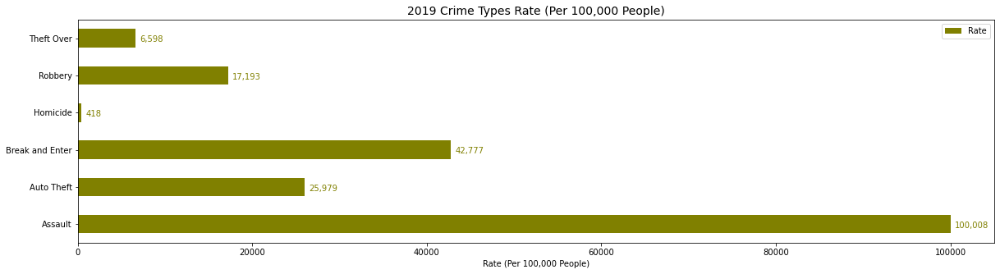

In [136]:
# generate plot
crime_type.plot(kind='barh', figsize=(20, 5), color='olive')
plt.xlabel('Rate (Per 100,000 People)')
plt.title('2019 Crime Types Rate (Per 100,000 People)', fontsize=14)

# annotate value labels to each country
for index, value in enumerate(crime_type['Rate']): 
    label = format(int(value), ',') # format int with commas    
    # place text at the end of bar (adding 500 from x, and 0.1 from y to make it fit within the bar)
    plt.annotate(label, xy=(value + 500, index - 0.10), color='olive')

plt.show()

## Identify Top 20 High & Top 10 Low Crime Rate Neighbourhoods

In [166]:
# add neighbourhood coordinates to table  
crime_geo=crime.join(neighbourhood_geo.set_index('Hood_ID'), on='Hood_ID')

# drop NaN records
crime_geo.dropna(subset=["Latitude"], axis=0, inplace=True)
crime_geo = crime_geo.reset_index(drop=True)
print('Crime rate table shape: {}'.format(crime_geo.shape))

# sort out high crime rate neighbourhoods
high_crime = crime_geo.sort_values(by=['Total_Crime_Rate_2019'],ascending=False).head(20)
print('Top 10 high crime rate neighbourhoods: {}'.format(high_crime['Neighbourhood'].tolist()))
high_crime

Crime rate table shape: (100, 12)
Top 10 high crime rate neighbourhoods: ['Bay Street Corridor', 'Moss Park', 'Kensington-Chinatown', 'University', 'West Humber-Clairville', 'Humber Summit', 'Yorkdale-Glen Park', 'Regent Park', 'West Hill', 'Downsview-Roding-CFB', 'North St.James Town', 'Annex', 'South Parkdale', 'Kennedy Park', 'Weston', 'Oakridge', 'Pelmo Park-Humberlea', 'South Riverdale', 'Trinity-Bellwoods', 'Glenfield-Jane Heights']


,Neighbourhood,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Total_Crime_Rate_2019,Latitude,Longitude
65,Bay Street Corridor,76,25797,3550.8,193.8,798.5,11.6,476.8,283.0,5314.5,43.650673,-79.387516
95,Moss Park,73,20506,3106.4,229.2,1141.1,14.6,668.1,121.9,5281.3,43.655566,-79.351742
31,Kensington-Chinatown,78,17945,2078.6,217.3,1549.2,0.0,256.3,206.2,4307.6,43.647188,-79.404011
37,University,79,7607,1630.1,118.3,1196.3,13.1,157.7,78.9,3194.4,43.656482,-79.407723
22,West Humber-Clairville,1,33312,795.5,1446.9,396.3,6.0,210.1,189.1,3043.9,43.709469,-79.552357
10,Humber Summit,21,12416,950.4,1087.3,459.1,24.2,225.5,177.2,2923.7,43.763018,-79.580644
0,Yorkdale-Glen Park,31,14804,1411.8,412.1,567.4,6.8,283.7,195.9,2877.7,43.705610,-79.439687
60,Regent Park,72,10803,1444.0,194.4,601.7,9.3,129.6,46.3,2425.3,43.657872,-79.354325
21,West Hill,136,27392,1573.5,164.3,284.8,7.3,259.2,14.6,2303.7,43.764869,-79.202059
64,Downsview-Roding-CFB,26,35052,1261.0,459.3,328.1,8.6,182.6,39.9,2279.5,43.717755,-79.507830


In [131]:
# sort out low crime rate neighbourhoods
low_crime = crime_geo.sort_values(by=['Total_Crime_Rate_2019'],ascending=False).tail(10)
print('Top 10 low crime rate neighbourhoods: {}'.format(low_crime['Neighbourhood'].tolist()))
low_crime

Top 10 low crime rate neighbourhoods: ['Alderwood', 'Bathurst Manor', 'Humewood-Cedarvale', 'Woodbine-Lumsden', 'Eringate-Centennial-West Deane', 'Markland Wood', 'Steeles', 'Pleasant View', 'Lawrence Park North', 'Guildwood']


,Neighbourhood,Hood_ID,Population,Assault_Rate_2019,AutoTheft_Rate_2019,BreakandEnter_Rate_2019,Homicide_Rate_2019,Robbery_Rate_2019,TheftOver_Rate_2019,Total_Crime_Rate_2019,Latitude,Longitude
59,Alderwood,20,12054,298.7,116.1,215.7,0.0,41.5,58.1,730.1,43.590216,-79.548657
58,Bathurst Manor,34,15873,315.0,151.2,138.6,0.0,75.6,31.5,711.9,43.761558,-79.439984
2,Humewood-Cedarvale,106,14365,320.2,111.4,181.0,0.0,69.6,27.8,710.0,43.683629,-79.418487
76,Woodbine-Lumsden,60,7865,381.4,89.0,127.1,12.7,38.1,50.9,699.2,43.696444,-79.317432
55,Eringate-Centennial-West Deane,11,18588,236.7,220.6,107.6,5.4,64.6,26.9,661.8,43.654247,-79.567298
89,Markland Wood,12,10554,161.1,85.3,246.4,0.0,113.7,28.4,634.9,43.636238,-79.559586
90,Steeles,116,24623,182.8,125.9,264.0,0.0,36.6,20.3,629.6,43.815651,-79.341318
99,Pleasant View,46,15818,278.2,151.7,75.9,0.0,94.8,25.3,625.9,43.795166,-79.343457
91,Lawrence Park North,105,14607,260.1,123.2,150.6,0.0,34.2,27.4,595.5,43.727682,-79.390077
18,Guildwood,140,9917,282.3,30.3,100.8,10.1,70.6,10.1,504.2,43.751132,-79.211280


In [179]:
#top_crime = crime_geo.sort_values(by=['Total_Crime_Rate_2019'],ascending=False).head(10)
top_crime = crime_geo.sort_values(by=['Total_Crime_Rate_2019'],ascending=False)
                                                                                     
top_crime=top_crime[['Neighbourhood','Assault_Rate_2019','AutoTheft_Rate_2019','BreakandEnter_Rate_2019','Homicide_Rate_2019','Robbery_Rate_2019','TheftOver_Rate_2019']]
top_crime.set_index('Neighbourhood', inplace=True)
top_crime.rename(columns={'Assault_Rate_2019':'Assault','AutoTheft_Rate_2019':'AutoTheft','BreakandEnter_Rate_2019':'Break&Enter','Homicide_Rate_2019':'Homicide','Robbery_Rate_2019':'Robbery','TheftOver_Rate_2019':'TheftOver'}, inplace=True)
top_crime.head()

,Assault,AutoTheft,Break&Enter,Homicide,Robbery,TheftOver
Neighbourhood,,,,,,
Bay Street Corridor,3550.8,193.8,798.5,11.6,476.8,283.0
Moss Park,3106.4,229.2,1141.1,14.6,668.1,121.9
Kensington-Chinatown,2078.6,217.3,1549.2,0.0,256.3,206.2
University,1630.1,118.3,1196.3,13.1,157.7,78.9
West Humber-Clairville,795.5,1446.9,396.3,6.0,210.1,189.1


Top crime rate neighbourhoods are ['Bay Street Corridor', 'Moss Park', 'Kensington-Chinatown', 'University', 'West Humber-Clairville', 'Humber Summit', 'Yorkdale-Glen Park', 'Regent Park', 'West Hill', 'Downsview-Roding-CFB', 'North St.James Town', 'Annex', 'South Parkdale', 'Kennedy Park', 'Weston', 'Oakridge', 'Pelmo Park-Humberlea', 'South Riverdale', 'Trinity-Bellwoods', 'Glenfield-Jane Heights', 'Black Creek', 'Wexford/Maryvale', 'Beechborough-Greenbrook', 'Niagara', 'Scarborough Village', 'Yonge-Eglinton', 'Dufferin Grove', 'Roncesvalles', 'New Toronto', 'Greenwood-Coxwell', 'Danforth', 'Weston-Pellam Park', 'Mimico', 'Birchcliffe-Cliffside', 'Bendale', 'Blake-Jones', 'Mount Olive-Silverstone-Jamestown', 'Milliken', 'Eglinton East', 'Agincourt South-Malvern West', 'Palmerston-Little Italy', 'Taylor-Massey', "O'Connor-Parkview", 'Morningside', 'Rosedale-Moore Park', 'Bridle Path-Sunnybrook-York Mills', 'Victoria Village', 'Long Branch', 'Elms-Old Rexdale', 'Corso Italia-Davenport'

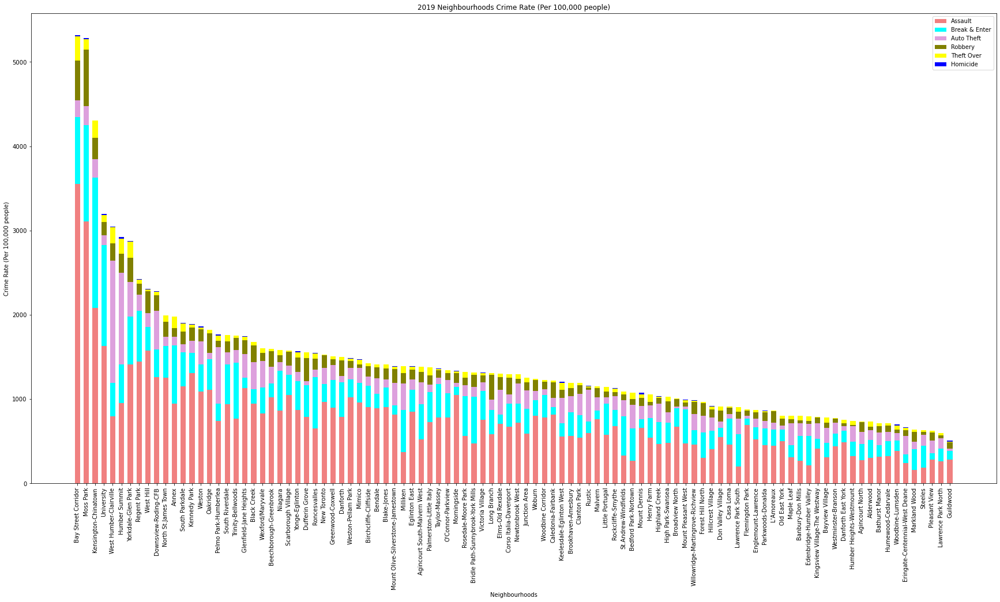

In [180]:
# create neighbourhood list
top_neighbourhoods=top_crime.index.values.tolist()
print('Top crime rate neighbourhoods are {}'.format(top_neighbourhoods))

assault = np.array(top_crime['Assault'])
enter = np.array(top_crime['Break&Enter'])
auto = np.array(top_crime['AutoTheft'])
robbery = np.array(top_crime['Robbery'])
theftover = np.array(top_crime['TheftOver'])
homicide = np.array(top_crime['Homicide'])

ind = [x for x, _ in enumerate(top_neighbourhoods)]

plt.figure(figsize=(30, 15))
plt.bar(ind, assault, width=0.6, label='Assault', color='lightcoral')
plt.bar(ind, enter, width=0.6, label='Break & Enter', color='cyan', bottom=assault)
plt.bar(ind, auto, width=0.6, label='Auto Theft', color='plum', bottom=assault+enter)
plt.bar(ind, robbery, width=0.6, label='Robbery', color='olive', bottom=assault+auto+enter)
plt.bar(ind, theftover, width=0.6, label='Theft Over', color='yellow', bottom=assault+auto+enter+robbery)
plt.bar(ind, homicide, width=0.6, label='Homicide', color='blue', bottom=assault+auto+enter+robbery+theftover)

plt.xticks(ind, top_neighbourhoods, rotation=90)
plt.xlabel('Neighbourhoods')
plt.ylabel('Crime Rate (Per 100,000 people)') 
plt.title('2019 Neighbourhoods Crime Rate (Per 100,000 people)')
plt.legend(loc='upper right')
plt.show()

## Visualize Top 20 High Crime Rate Neighbourhoods on Map

In [355]:
# instantiate a feature group for the crimes in the dataframe
crime_map = folium.Map(location=[latitude, longitude], zoom_start=11)
crime_feature = folium.map.FeatureGroup()
print('{} high crime rate neighbourhoods'.format(high_crime.shape[0]))
print('{} low crime rate neighbourhoods'.format(low_crime.shape[0]))

# add pop-up text to each marker on the map
latitudes = list(high_crime.Latitude)
longitudes = list(high_crime.Longitude)
labels = list(high_crime.Total_Crime_Rate_2019)
hoods = list(high_crime.Neighbourhood)

for lat, lng, label, hood in zip(latitudes, longitudes, labels, hoods):
    value = hood + ' crime rate ' + str(round(label,1))
    crime_feature.add_child(
        folium.Marker([lat, lng], popup=value, icon=folium.Icon(color='gray')) 
    )

'''
latitudes = list(low_crime.Latitude)
longitudes = list(low_crime.Longitude)
labels = list(low_crime.Total_Crime_Rate_2019)
hoods = list(low_crime.Neighbourhood)

for lat, lng, label, hood in zip(latitudes, longitudes, labels, hoods):
    value = hood + ' crime rate ' + str(round(label,1))
    folium.Marker([lat, lng], popup=value, icon=folium.Icon(color='green')).add_to(crime_map)   
'''    
# add crimes to map
crime_map.add_child(crime_feature)
crime_map

20 high crime rate neighbourhoods
10 low crime rate neighbourhoods


In [163]:
'''
# create neighbourhood list
top_neighbourhoods=top_crime.index.values.tolist()
print('Top crime rate neighbourhoods are {}'.format(top_neighbourhoods))

# create bar chart color
color = ['lightcoral','plum','cyan','olive','tan']
print('Use color map {}'.format(color))

for index, value in enumerate(top_neighbourhoods):
    hood=top_crime.iloc[index,:]
    hood.plot(kind='barh', figsize=(20, 4), color=color[index])
    plt.xlabel('Number of Cases Per 100,000 people')
    plt.title(top_crime.index.tolist()[index], fontsize=14)

    # annotate value labels to each bar
    for index, value in enumerate(hood): 
        label = format(int(value), ',') # format int with commas
    
        # place text at the end of bar 
        plt.annotate(label, xy=(value + 10, index - 0.10), color='black')
    plt.show()
'''

"\n# create neighbourhood list\ntop_neighbourhoods=top_crime.index.values.tolist()\nprint('Top crime rate neighbourhoods are {}'.format(top_neighbourhoods))\n\n# create bar chart color\ncolor = ['lightcoral','plum','cyan','olive','tan']\nprint('Use color map {}'.format(color))\n\nfor index, value in enumerate(top_neighbourhoods):\n    hood=top_crime.iloc[index,:]\n    hood.plot(kind='barh', figsize=(20, 4), color=color[index])\n    plt.xlabel('Number of Cases Per 100,000 people')\n    plt.title(top_crime.index.tolist()[index], fontsize=14)\n\n    # annotate value labels to each bar\n    for index, value in enumerate(hood): \n        label = format(int(value), ',') # format int with commas\n    \n        # place text at the end of bar \n        plt.annotate(label, xy=(value + 10, index - 0.10), color='black')\n    plt.show()\n"

## Explore nearby venues and their categories of Toronto City neighbourhoods by Foursquare API

In [175]:
# Initiate Foursquare API call parameters
CLIENT_ID = '' # your Foursquare ID
CLIENT_SECRET = '' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

In [176]:
def getNearbyVenues(codes, names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for code, name, lat, lng in zip(codes, names, latitudes, longitudes):
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()['response']['groups'][0]['items']
        # print(results)
        # return only relevant information for each nearby venue
        venues_list.append([(
            code,
            name, 
            lat, 
            lng, 
            v['venue']['id'],
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])
        print('{}: {} venues in {} {}'.format(venues_list.__len__(), venues_list[venues_list.__len__()-1].__len__(), code, name)) # print number of venues found in each neighbourhood

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Postal Code',
                  'Neighbourhood', 
                  'Neighbourhood Latitude', 
                  'Neighbourhood Longitude', 
                  'Venue ID',
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [48]:
# Query popoluar venues of each neighbourhood, 500m
toronto_venues_500 = getNearbyVenues(codes=toronto_geo['Postal Code'],
                                   names=toronto_geo['Neighbourhood'],
                                   latitudes=toronto_geo['Latitude'],
                                   longitudes=toronto_geo['Longitude'],
                                   radius=500
                                  )
#toronto_venues = getNearbyVenues(['testcode'],['testname'],[43.65426],[-79.360636])
toronto_venues = toronto_venues_500

1: 3 venues in M3A Parkwoods
2: 5 venues in M4A Victoria Village
3: 44 venues in M5A Regent Park, Harbourfront
4: 12 venues in M6A Lawrence Manor, Lawrence Heights
5: 32 venues in M7A Queen's Park, Ontario Provincial Government
6: 0 venues in M9A Islington Avenue, Humber Valley Village
7: 1 venues in M1B Malvern, Rouge
8: 6 venues in M3B Don Mills
9: 10 venues in M4B Parkview Hill, Woodbine Gardens
10: 100 venues in M5B Garden District, Ryerson
11: 5 venues in M6B Glencairn
12: 1 venues in M9B West Deane Park, Princess Gardens, Martin Grove, Islington, Cloverdale
13: 1 venues in M1C Rouge Hill, Port Union, Highland Creek
14: 20 venues in M3C Don Mills
15: 7 venues in M4C Woodbine Heights
16: 79 venues in M5C St. James Town
17: 5 venues in M6C Humewood-Cedarvale
18: 8 venues in M9C Eringate, Bloordale Gardens, Old Burnhamthorpe, Markland Wood
19: 8 venues in M1E Guildwood, Morningside, West Hill
20: 4 venues in M4E The Beaches
21: 56 venues in M5E Berczy Park
22: 4 venues in M6E Caledon

In [181]:
# Query popoluar venues of each neighbourhood, 1km
toronto_venues_1000 = getNearbyVenues(codes=toronto_geo['Postal Code'],
                                   names=toronto_geo['Neighbourhood'],
                                   latitudes=toronto_geo['Latitude'],
                                   longitudes=toronto_geo['Longitude'],
                                   radius=1000
                                  )
#toronto_venues = getNearbyVenues(['testcode'],['testname'],[43.65426],[-79.360636])
toronto_venues = toronto_venues_1000

1: 28 venues in M3A Parkwoods
2: 12 venues in M4A Victoria Village
3: 100 venues in M5A Regent Park, Harbourfront
4: 46 venues in M6A Lawrence Manor, Lawrence Heights
5: 100 venues in M7A Queen's Park, Ontario Provincial Government
6: 12 venues in M9A Islington Avenue, Humber Valley Village
7: 23 venues in M1B Malvern, Rouge
8: 27 venues in M3B Don Mills
9: 19 venues in M4B Parkview Hill, Woodbine Gardens
10: 100 venues in M5B Garden District, Ryerson
11: 33 venues in M6B Glencairn
12: 13 venues in M9B West Deane Park, Princess Gardens, Martin Grove, Islington, Cloverdale
13: 5 venues in M1C Rouge Hill, Port Union, Highland Creek
14: 47 venues in M3C Don Mills
15: 27 venues in M4C Woodbine Heights
16: 100 venues in M5C St. James Town
17: 31 venues in M6C Humewood-Cedarvale
18: 16 venues in M9C Eringate, Bloordale Gardens, Old Burnhamthorpe, Markland Wood
19: 22 venues in M1E Guildwood, Morningside, West Hill
20: 80 venues in M4E The Beaches
21: 100 venues in M5E Berczy Park
22: 22 venu

In [186]:
print('{} venues are discovered.'.format(toronto_venues.shape[0]))
print('There are {} unique venues and {} unique categories.'.format(len(toronto_venues['Venue ID'].unique()), len(toronto_venues['Venue Category'].unique())))
print('Venues are found in {} postal codes and {} neighbourhoods.'.format(len(toronto_venues['Postal Code'].unique()), len(toronto_venues['Neighbourhood'].unique())))
toronto_venues.describe(include='all')

4890 venues are discovered.
There are 3625 unique venues and 329 unique categories.
Venues are found in 102 postal codes and 98 neighbourhoods.


,Postal Code,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue ID,Venue,Venue Latitude,Venue Longitude,Venue Category
count,4890,4890,4890.000000,4890.000000,4890,4890,4890.000000,4890.000000,4890
unique,102,98,NaN,NaN,3625,2810,NaN,NaN,329
top,M5C,"The Annex, North Midtown, Yorkville",NaN,NaN,59cd51c71b0ea516e9e7b3aa,Tim Hortons,NaN,NaN,Coffee Shop
freq,100,100,NaN,NaN,9,98,NaN,NaN,371
mean,NaN,NaN,43.684694,-79.392318,NaN,NaN,43.684377,-79.392624,NaN
std,NaN,NaN,0.044955,0.068780,NaN,NaN,0.044776,0.068715,NaN
min,NaN,NaN,43.602414,-79.615819,NaN,NaN,43.593866,-79.626960,NaN
25%,NaN,NaN,43.651494,-79.419750,NaN,NaN,43.650653,-79.419247,NaN
50%,NaN,NaN,43.668999,-79.384568,NaN,NaN,43.666755,-79.386748,NaN
75%,NaN,NaN,43.709060,-79.360636,NaN,NaN,43.707303,-79.360775,NaN


## Analyse High density neighbourhoods

In [187]:
toronto_venues=toronto_venues_1000
toronto_venues.head()

,Postal Code,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue ID,Venue,Venue Latitude,Venue Longitude,Venue Category
0,M3A,Parkwoods,43.753259,-79.329656,4b8991cbf964a520814232e3,Allwyn's Bakery,43.759840,-79.324719,Caribbean Restaurant
1,M3A,Parkwoods,43.753259,-79.329656,4e8d9dcdd5fbbbb6b3003c7b,Brookbanks Park,43.751976,-79.332140,Park
2,M3A,Parkwoods,43.753259,-79.329656,57e286f2498e43d84d92d34a,Tim Hortons,43.760668,-79.326368,Café
3,M3A,Parkwoods,43.753259,-79.329656,58a8dcaa6119f47b9a94dc05,A&W,43.760643,-79.326865,Fast Food Restaurant
4,M3A,Parkwoods,43.753259,-79.329656,4bafa285f964a5203a123ce3,Bruno's valu-mart,43.746143,-79.324630,Grocery Store


In [188]:
# Identify postal codes having more than 30 venues
l=toronto_venues.groupby('Postal Code')['Venue'].count()>30
l=l.loc[l.values==True]
print('{} neighbourhoods are considered as high density groups.'.format(len(l)))
print(l.index.tolist())

# Segment neighbourhoods into HIGH and LOW density groups
hd_hood=toronto_venues[toronto_venues['Postal Code'].isin(l.index.tolist())] # high density
print('{} venues are in high density neighbourhoods.'.format(hd_hood.shape[0]))
ld_hood=toronto_venues[~toronto_venues['Postal Code'].isin(l.index.tolist())] # low density
print('{} venues are in low density neighbourhoods.'.format(ld_hood.shape[0]))

hd_hood.head()

54 neighbourhoods are considered as high density groups.
['M1P', 'M1R', 'M1S', 'M1T', 'M2J', 'M2N', 'M3C', 'M3N', 'M4E', 'M4G', 'M4H', 'M4J', 'M4K', 'M4L', 'M4M', 'M4P', 'M4R', 'M4S', 'M4T', 'M4V', 'M4X', 'M4Y', 'M5A', 'M5B', 'M5C', 'M5E', 'M5G', 'M5H', 'M5J', 'M5K', 'M5L', 'M5M', 'M5P', 'M5R', 'M5S', 'M5T', 'M5W', 'M5X', 'M6A', 'M6B', 'M6C', 'M6G', 'M6H', 'M6J', 'M6K', 'M6N', 'M6P', 'M6R', 'M6S', 'M7A', 'M7R', 'M7Y', 'M8X', 'M8Z']
4054 venues are in high density neighbourhoods.
836 venues are in low density neighbourhoods.


,Postal Code,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue ID,Venue,Venue Latitude,Venue Longitude,Venue Category
40,M5A,"Regent Park, Harbourfront",43.65426,-79.360636,54ea41ad498e9a11e9e13308,Roselle Desserts,43.653447,-79.362017,Bakery
41,M5A,"Regent Park, Harbourfront",43.65426,-79.360636,53b8466a498e83df908c3f21,Tandem Coffee,43.653559,-79.361809,Coffee Shop
42,M5A,"Regent Park, Harbourfront",43.65426,-79.360636,5612b1cc498e3dd742af0dc8,Impact Kitchen,43.656369,-79.356980,Restaurant
43,M5A,"Regent Park, Harbourfront",43.65426,-79.360636,4ad4c05ef964a520bff620e3,The Distillery Historic District,43.650244,-79.359323,Historic Site
44,M5A,"Regent Park, Harbourfront",43.65426,-79.360636,574c229e498ebb5c6b257902,Cooper Koo Family YMCA,43.653249,-79.358008,Distribution Center


In [189]:
hd_hood=toronto_venues
hd_hood.shape
hd_hood.head()

,Postal Code,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue ID,Venue,Venue Latitude,Venue Longitude,Venue Category
0,M3A,Parkwoods,43.753259,-79.329656,4b8991cbf964a520814232e3,Allwyn's Bakery,43.759840,-79.324719,Caribbean Restaurant
1,M3A,Parkwoods,43.753259,-79.329656,4e8d9dcdd5fbbbb6b3003c7b,Brookbanks Park,43.751976,-79.332140,Park
2,M3A,Parkwoods,43.753259,-79.329656,57e286f2498e43d84d92d34a,Tim Hortons,43.760668,-79.326368,Café
3,M3A,Parkwoods,43.753259,-79.329656,58a8dcaa6119f47b9a94dc05,A&W,43.760643,-79.326865,Fast Food Restaurant
4,M3A,Parkwoods,43.753259,-79.329656,4bafa285f964a5203a123ce3,Bruno's valu-mart,43.746143,-79.324630,Grocery Store


## Massage data to review top venue categories that each neighbourhood is most characterized with.

In [190]:
# one hot encoding
toronto_onehot = pd.get_dummies(hd_hood[['Venue Category']], prefix="", prefix_sep="")

# add postal code column back to dataframe
toronto_onehot['Postal Code'] = hd_hood['Postal Code'] 

# move postal code column to the first column
fixed_columns = [toronto_onehot.columns[-1]] + list(toronto_onehot.columns[:-1])
toronto_onehot = toronto_onehot[fixed_columns]

print('Toronto onehot shape: {}'.format(toronto_onehot.shape))
toronto_onehot.head()

Toronto onehot shape: (4890, 330)


,Postal Code,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Stadium,Beach,Beach Bar,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Bookstore,Botanical Garden,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Castle,Cemetery,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Churrascaria,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,College Quad,College Rec Center,College Stadium,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Escape Room,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fireworks Store,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Intersection,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundry Service,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Marijuana Dispensary,Market,Martial Arts School,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Moving Target,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoors & Recreation,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pastry Shop,Performing Arts Venue,Persian Restaurant,Pet Store,Pharmacy,Photography Studio,Pide Place,Pie Shop,Pilates Studio,Pizza Place,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Poutine Place,Pub,Ramen Restaurant,Record Shop,Recreation Center,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Road,Rock Climbing Spot,Rock Club,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shoe Store,Shop & Service,Shopping Mall,Skate Park,Skating Rink,Ski Area,Ski Chalet,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restauran

In [191]:
# group by postal code to get the count of venues
grouped_venue_count = toronto_onehot[['Postal Code','ATM']].groupby('Postal Code').count().reset_index()
print('Grouped venue count shape: {}'.format(grouped_venue_count.shape))
grouped_venue_count.rename(columns={'ATM':'Count'}, inplace=True)
grouped_venue_count.head()

Grouped venue count shape: (102, 2)


,Postal Code,Count
0,M1B,23
1,M1C,5
2,M1E,22
3,M1G,8
4,M1H,29


In [192]:
# group by postal code to get the mean of each venue category
toronto_grouped = toronto_onehot.groupby('Postal Code').mean().reset_index()
print('Postal code group shape: {}'.format(toronto_grouped.shape))
toronto_grouped.head()

Postal code group shape: (102, 330)


,Postal Code,ATM,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,Airport,Airport Lounge,American Restaurant,Amphitheater,Animal Shelter,Antique Shop,Aquarium,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,Automotive Shop,BBQ Joint,Baby Store,Badminton Court,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Stadium,Beach,Beach Bar,Beer Bar,Beer Store,Belgian Restaurant,Bike Shop,Bistro,Bookstore,Botanical Garden,Boutique,Bowling Alley,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Burger Joint,Burrito Place,Bus Line,Bus Station,Bus Stop,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Camera Store,Candy Store,Cantonese Restaurant,Caribbean Restaurant,Castle,Cemetery,Cheese Shop,Chinese Restaurant,Chiropractor,Chocolate Shop,Churrascaria,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Gym,College Quad,College Rec Center,College Stadium,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Convenience Store,Cosmetics Shop,Coworking Space,Creperie,Cuban Restaurant,Cupcake Shop,Curling Ice,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Dim Sum Restaurant,Diner,Discount Store,Distribution Center,Dive Bar,Dog Run,Doner Restaurant,Donut Shop,Dry Cleaner,Dumpling Restaurant,Eastern European Restaurant,Electronics Store,Escape Room,Ethiopian Restaurant,Event Space,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Fireworks Store,Fish & Chips Shop,Fish Market,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,German Restaurant,Gift Shop,Golf Course,Golf Driving Range,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Hakka Restaurant,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Intersection,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Lake,Latin American Restaurant,Laundry Service,Light Rail Station,Lingerie Store,Liquor Store,Lounge,Malay Restaurant,Marijuana Dispensary,Market,Martial Arts School,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Metro Station,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Modern European Restaurant,Monument / Landmark,Moroccan Restaurant,Movie Theater,Moving Target,Museum,Music School,Music Store,Music Venue,Nail Salon,Neighborhood,New American Restaurant,Nightclub,Noodle House,Office,Optical Shop,Organic Grocery,Other Great Outdoors,Other Repair Shop,Outdoors & Recreation,Pakistani Restaurant,Paper / Office Supplies Store,Park,Pastry Shop,Performing Arts Venue,Persian Restaurant,Pet Store,Pharmacy,Photography Studio,Pide Place,Pie Shop,Pilates Studio,Pizza Place,Playground,Plaza,Poke Place,Pool,Pool Hall,Portuguese Restaurant,Poutine Place,Pub,Ramen Restaurant,Record Shop,Recreation Center,Rental Car Location,Residential Building (Apartment / Condo),Restaurant,River,Road,Rock Climbing Spot,Rock Club,Roof Deck,Sake Bar,Salad Place,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Sculpture Garden,Seafood Restaurant,Shoe Store,Shop & Service,Shopping Mall,Skate Park,Skating Rink,Ski Area,Ski Chalet,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Soccer Stadium,Social Club,Soup Place,South American Restauran

## Cluster the neighbourhoods by commonality of their nearby venues categories.

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0]
[1 1 2 1 2 2 2 2 2 1 1 2 2 2 2 2 2 1 2 0 1 1 1 2 2 1 1 1 1 1 0 1 2 1 2 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2
 1 1 1 1 2 2 1 1 1 1 1 1 1 1 2 1 0 1 2 2 2 2 2 1 2 2 2 1]
[3 1 1 1 1 1 1 1 1 3 1 1 1 1 1 1 1 3 1 0 3 3 1 1 1 3 3 1 3 3 1 2 1 3 1 3 3
 3 1 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 1 1 1
 3 3 3 3 1 1 1 3 3 3 3 3 3 1 1 3 0 3 1 1 3 1 1 1 1 1 1 3]
[4 2 4 4 4 4 4 4 2 2 4 4 4 4 4 4 4 4 4 1 0 4 4 2 2 0 0 4 4 0 2 3 4 4 4 0 0
 4 4 0 0 0 0 0 0 0 0 0 0 4 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 4 4 4 2
 0 0 0 0 4 4 4 0 0

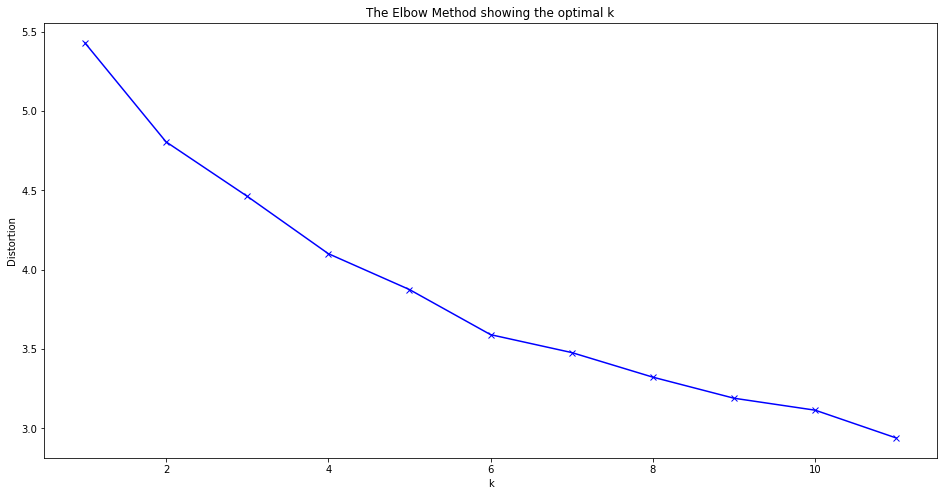

In [193]:
toronto_grouped_clustering = toronto_grouped.drop('Postal Code', 1)

# find optimal k of k-means clustering by elbow method
distortions = []
K = range(1,12)
for k in K:
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=10).fit(toronto_grouped_clustering)
    distortions.append(kmeans.inertia_)
    print(kmeans.labels_)
plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [194]:
toronto_grouped_clustering = toronto_grouped.drop('Postal Code', 1)

# set number of clusters
kclusters = 6

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0, n_init=10).fit(toronto_grouped_clustering)

# check cluster labels generated for each row in the dataframe
#print(kmeans.cluster_centers_)
print(kmeans.labels_)#[0:53] 
label=kmeans.labels_.dtype

[0 4 0 4 0 0 0 0 4 4 0 0 0 0 0 0 0 0 0 2 3 0 4 4 4 3 3 0 0 3 4 1 0 0 0 3 3
 0 0 3 3 3 3 3 3 3 3 3 3 0 3 3 3 3 3 3 3 3 3 3 3 0 3 3 3 3 3 3 3 3 0 0 0 4
 3 3 3 3 0 0 0 3 3 3 3 3 4 4 4 3 4 3 4 4 0 4 4 0 0 0 4 5]


## Sort out top venue categories of each neighbourhood

In [195]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [232]:
# get nth most common venues of each neighbourhood
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Postal Code']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighbourhoods_venues_sorted = pd.DataFrame(columns=columns)
neighbourhoods_venues_sorted['Postal Code'] = toronto_grouped['Postal Code']

for ind in np.arange(toronto_grouped.shape[0]):
    neighbourhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(toronto_grouped.iloc[ind, :], num_top_venues)

print('Neighbourhoods venues sorted shape: {}'.format(neighbourhoods_venues_sorted.shape))
neighbourhoods_venues_sorted.head()

Neighbourhoods venues sorted shape: (102, 6)


,Postal Code,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,M1B,Fast Food Restaurant,Coffee Shop,Trail,Restaurant,Hobby Shop
1,M1C,Breakfast Spot,Park,Playground,Burger Joint,Italian Restaurant
2,M1E,Pizza Place,Bank,Fast Food Restaurant,Restaurant,Food & Drink Shop
3,M1G,Coffee Shop,Park,Indian Restaurant,Chinese Restaurant,Fast Food Restaurant
4,M1H,Grocery Store,Gas Station,Bank,Bakery,Coffee Shop


In [233]:
# add clustering labels
neighbourhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)
#neighbourhood_top10=neighbourhood_top10.astype({'Cluster Labels' : int})

# add back latitude/longitude for each neighbourhood group
toronto_merged = toronto_geo
toronto_merged = toronto_merged.join(neighbourhoods_venues_sorted.set_index('Postal Code'), on='Postal Code')
#neighbourhoods_venues_sorted = neighbourhoods_venues_sorted.join(toronto_merged.set_index('Neighbourhood'), on='Neighbourhood')

# add back grouped venue count 
toronto_merged = toronto_merged.join(grouped_venue_count.set_index('Postal Code'), on='Postal Code')

# Drop NaN records
toronto_merged.dropna(subset=["Cluster Labels"], axis=0, inplace=True)
toronto_merged = toronto_merged.reset_index(drop=True)

print('Neighbourhoods venues sorted labeled shape: {}'.format(toronto_merged.shape))
toronto_merged.head()

Neighbourhoods venues sorted labeled shape: (102, 12)


,Postal Code,Borough,Neighbourhood,Latitude,Longitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Count
0,M3A,North York,Parkwoods,43.753259,-79.329656,4.0,Park,Shopping Mall,Pharmacy,Bus Stop,ATM,28.0
1,M4A,North York,Victoria Village,43.725882,-79.315572,0.0,Coffee Shop,Hockey Arena,Sporting Goods Shop,Portuguese Restaurant,Pizza Place,12.0
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",43.654260,-79.360636,3.0,Coffee Shop,Restaurant,Café,Park,Theater,100.0
3,M6A,North York,"Lawrence Manor, Lawrence Heights",43.718518,-79.464763,0.0,Clothing Store,Coffee Shop,Fast Food Restaurant,Restaurant,Vietnamese Restaurant,46.0
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",43.662301,-79.389494,3.0,Coffee Shop,Park,Sushi Restaurant,Italian Restaurant,Ramen Restaurant,100.0


In [283]:
# group by 1st Most Common Venue to get the count of each venue category
most_common_venue = toronto_merged[['1st Most Common Venue','Count']].groupby('1st Most Common Venue').count().reset_index()
print('most_common_venue shape: {}'.format(most_common_venue.shape))
most_common_venue = most_common_venue.sort_values(by=['Count'],ascending=False)
most_common_venue.set_index('1st Most Common Venue', inplace=True)
most_common_venue.rename(columns={'Count':'Number of Neighbourhood Groups'}, inplace=True)
most_common_venue.head()

# cluster 0
cluster=toronto_merged[toronto_merged['Cluster Labels']==0.0]
cluster0 = cluster[['1st Most Common Venue','Count']].groupby('1st Most Common Venue').count().reset_index()
print('cluster 0: {}'.format(cluster0.shape))
cluster0 = cluster0.sort_values(by=['Count'],ascending=False)
cluster0.set_index('1st Most Common Venue', inplace=True)
cluster0.rename(columns={'Count':'Number of Neighbourhood Groups'}, inplace=True)
cluster0.head()

# cluster 3
cluster=toronto_merged[toronto_merged['Cluster Labels']==3.0]
cluster3 = cluster[['1st Most Common Venue','Count']].groupby('1st Most Common Venue').count().reset_index()
print('cluster 3: {}'.format(cluster3.shape))
cluster3 = cluster3.sort_values(by=['Count'],ascending=False)
cluster3.set_index('1st Most Common Venue', inplace=True)
cluster3.rename(columns={'Count':'Number of Neighbourhood Groups'}, inplace=True)
cluster3.head()

# cluster 4
cluster=toronto_merged[toronto_merged['Cluster Labels']==4.0]
cluster4 = cluster[['1st Most Common Venue','Count']].groupby('1st Most Common Venue').count().reset_index()
print('cluster 4: {}'.format(cluster4.shape))
cluster4 = cluster4.sort_values(by=['Count'],ascending=False)
cluster4.set_index('1st Most Common Venue', inplace=True)
cluster4.rename(columns={'Count':'Number of Neighbourhood Groups'}, inplace=True)
cluster4.head()

# cluster 1
cluster=toronto_merged[toronto_merged['Cluster Labels']==1.0]
cluster1 = cluster[['1st Most Common Venue','Count']].groupby('1st Most Common Venue').count().reset_index()
print('cluster 1: {}'.format(cluster1.shape))
cluster1 = cluster1.sort_values(by=['Count'],ascending=False)
cluster1.set_index('1st Most Common Venue', inplace=True)
cluster1.rename(columns={'Count':'Number of Neighbourhood Groups'}, inplace=True)
cluster1.head()

# cluster 2
cluster=toronto_merged[toronto_merged['Cluster Labels']==2.0]
cluster2 = cluster[['1st Most Common Venue','Count']].groupby('1st Most Common Venue').count().reset_index()
print('cluster 2: {}'.format(cluster2.shape))
cluster2 = cluster2.sort_values(by=['Count'],ascending=False)
cluster2.set_index('1st Most Common Venue', inplace=True)
cluster2.rename(columns={'Count':'Number of Neighbourhood Groups'}, inplace=True)
cluster2.head()

# cluster 5
cluster=toronto_merged[toronto_merged['Cluster Labels']==5.0]
cluster5 = cluster[['1st Most Common Venue','Count']].groupby('1st Most Common Venue').count().reset_index()
print('cluster 5: {}'.format(cluster5.shape))
cluster5 = cluster5.sort_values(by=['Count'],ascending=False)
cluster5.set_index('1st Most Common Venue', inplace=True)
cluster5.rename(columns={'Count':'Number of Neighbourhood Groups'}, inplace=True)
cluster5.head()

most_common_venue shape: (36, 2)
cluster 0: (17, 2)
cluster 3: (15, 2)
cluster 4: (11, 2)
cluster 1: (1, 2)
cluster 2: (1, 2)
cluster 5: (1, 2)


,Number of Neighbourhood Groups
1st Most Common Venue,
Moving Target,1


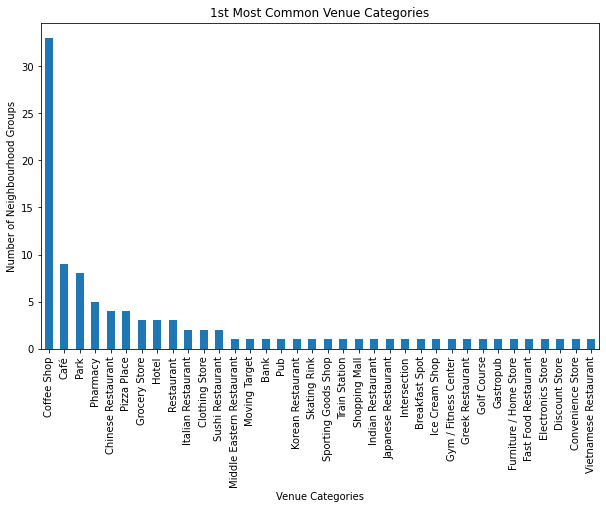

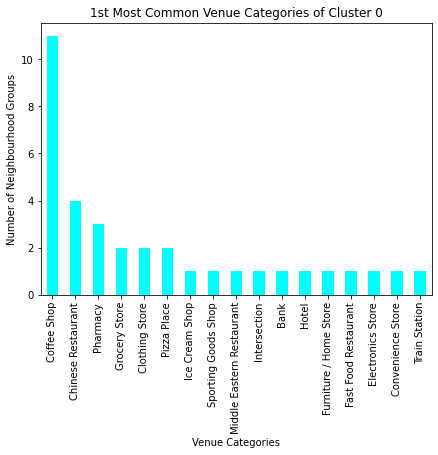

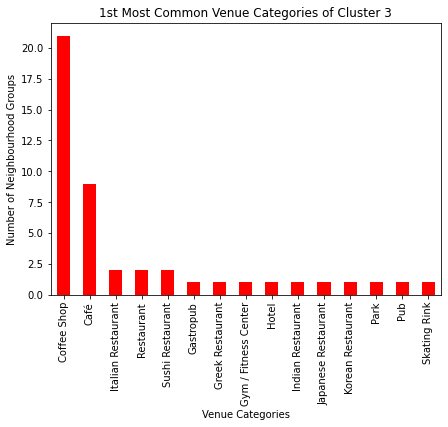

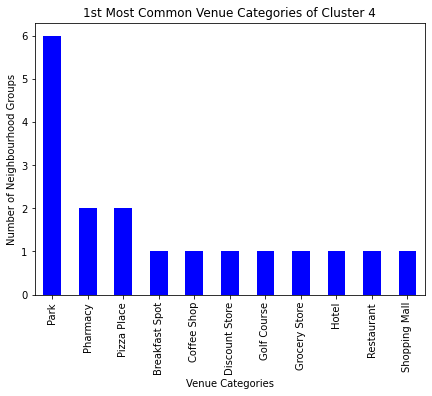

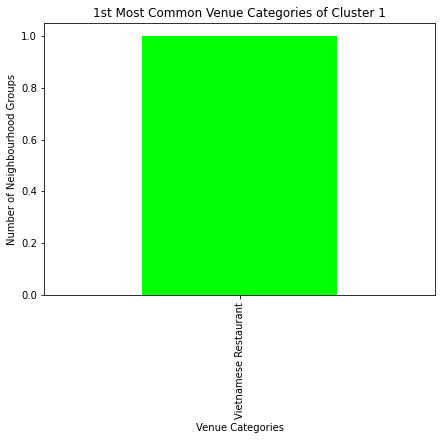

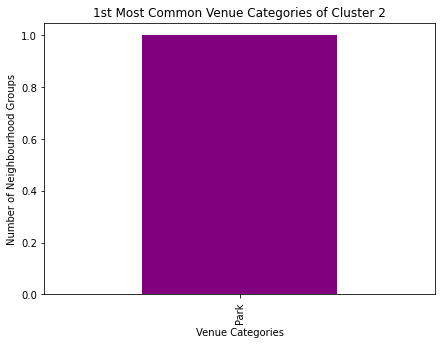

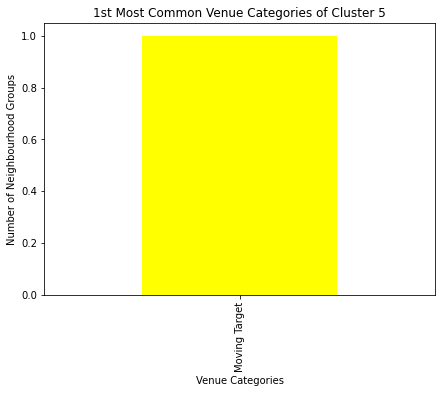

In [306]:
# plot bar chart 
most_common_venue['Number of Neighbourhood Groups'].plot(kind='bar', figsize=(10, 6))

plt.xlabel('Venue Categories') # add to x-label to the plot
plt.ylabel('Number of Neighbourhood Groups') # add y-label to the plot
plt.title('1st Most Common Venue Categories') # add title to the plot

plt.show()

cluster0['Number of Neighbourhood Groups'].plot(kind='bar', figsize=(7, 5), color='cyan')

plt.xlabel('Venue Categories') # add to x-label to the plot
plt.ylabel('Number of Neighbourhood Groups') # add y-label to the plot
plt.title('1st Most Common Venue Categories of Cluster 0') # add title to the plot

plt.show()

cluster3['Number of Neighbourhood Groups'].plot(kind='bar', figsize=(7, 5), color='red')

plt.xlabel('Venue Categories') # add to x-label to the plot
plt.ylabel('Number of Neighbourhood Groups') # add y-label to the plot
plt.title('1st Most Common Venue Categories of Cluster 3') # add title to the plot

plt.show()

cluster4['Number of Neighbourhood Groups'].plot(kind='bar', figsize=(7, 5), color='blue')

plt.xlabel('Venue Categories') # add to x-label to the plot
plt.ylabel('Number of Neighbourhood Groups') # add y-label to the plot
plt.title('1st Most Common Venue Categories of Cluster 4') # add title to the plot

plt.show()

cluster1['Number of Neighbourhood Groups'].plot(kind='bar', figsize=(7, 5), color='lime')

plt.xlabel('Venue Categories') # add to x-label to the plot
plt.ylabel('Number of Neighbourhood Groups') # add y-label to the plot
plt.title('1st Most Common Venue Categories of Cluster 1') # add title to the plot

plt.show()

cluster2['Number of Neighbourhood Groups'].plot(kind='bar', figsize=(7, 5), color='purple')

plt.xlabel('Venue Categories') # add to x-label to the plot
plt.ylabel('Number of Neighbourhood Groups') # add y-label to the plot
plt.title('1st Most Common Venue Categories of Cluster 2') # add title to the plot

plt.show()

cluster5['Number of Neighbourhood Groups'].plot(kind='bar', figsize=(7, 5), color='yellow')

plt.xlabel('Venue Categories') # add to x-label to the plot
plt.ylabel('Number of Neighbourhood Groups') # add y-label to the plot
plt.title('1st Most Common Venue Categories of Cluster 5') # add title to the plot

plt.show()

## Visualize Toronto neighbourhood clusters

In [317]:
'''
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = ['cyan','lime','purple','red','blue','yellow']

# add markers to the map
markers_colors = []
for lat, lon, poi, hood, cluster, v1, v2, v3, v4, v5, count in zip(toronto_merged['Latitude'], toronto_merged['Longitude'], toronto_merged['Postal Code'], toronto_merged['Neighbourhood'], toronto_merged['Cluster Labels'], toronto_merged['1st Most Common Venue'], toronto_merged['2nd Most Common Venue'], toronto_merged['3rd Most Common Venue'], toronto_merged['4th Most Common Venue'], toronto_merged['5th Most Common Venue'], toronto_merged['Count']):
    label = folium.Popup(str(poi) + ' ' + hood + ' ' + str(int(count)) + ' venues : ' + v1 + ', ' + v2 + ', ' + v3 + ', ' + v4 + ', ' + v5, parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)],
        fill=True,
        fill_color=rainbow[int(cluster)],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters
'''

"\n# create map\nmap_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)\n\n# set color scheme for the clusters\nx = np.arange(kclusters)\nys = [i + x + (i*x)**2 for i in range(kclusters)]\ncolors_array = cm.rainbow(np.linspace(0, 1, len(ys)))\nrainbow = ['cyan','lime','purple','red','blue','yellow']\n\n# add markers to the map\nmarkers_colors = []\nfor lat, lon, poi, hood, cluster, v1, v2, v3, v4, v5, count in zip(toronto_merged['Latitude'], toronto_merged['Longitude'], toronto_merged['Postal Code'], toronto_merged['Neighbourhood'], toronto_merged['Cluster Labels'], toronto_merged['1st Most Common Venue'], toronto_merged['2nd Most Common Venue'], toronto_merged['3rd Most Common Venue'], toronto_merged['4th Most Common Venue'], toronto_merged['5th Most Common Venue'], toronto_merged['Count']):\n    label = folium.Popup(str(poi) + ' ' + hood + ' ' + str(int(count)) + ' venues : ' + v1 + ', ' + v2 + ', ' + v3 + ', ' + v4 + ', ' + v5, parse_html=True)\n    folium.CircleMa

In [353]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)
cluster_feature = folium.map.FeatureGroup()

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = ['cyan','lime','purple','red','blue','yellow']

# add markers to the map
markers_colors = []
for lat, lon, poi, hood, cluster, v1, v2, v3, v4, v5, count in zip(toronto_merged['Latitude'], toronto_merged['Longitude'], toronto_merged['Postal Code'], toronto_merged['Neighbourhood'], toronto_merged['Cluster Labels'], toronto_merged['1st Most Common Venue'], toronto_merged['2nd Most Common Venue'], toronto_merged['3rd Most Common Venue'], toronto_merged['4th Most Common Venue'], toronto_merged['5th Most Common Venue'], toronto_merged['Count']):
    label = folium.Popup(str(poi) + ' ' + hood + ' ' + str(int(count)) + ' venues : ' + v1 + ', ' + v2 + ', ' + v3 + ', ' + v4 + ', ' + v5, parse_html=True)
    cluster_feature.add_child(
        folium.features.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[int(cluster)],
        fill=True,
        fill_color=rainbow[int(cluster)],
        fill_opacity=1)
    )#.add_to(map_clusters)
       
map_clusters.add_child(cluster_feature)


## Examine clusters

In [211]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 0, toronto_merged.columns[[0] + [1] + [2] + list(range(5, toronto_merged.shape[1]))]]

,Postal Code,Borough,Neighbourhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Count
1,M4A,North York,Victoria Village,0.0,Coffee Shop,Hockey Arena,Sporting Goods Shop,Portuguese Restaurant,Pizza Place,12.0
3,M6A,North York,"Lawrence Manor, Lawrence Heights",0.0,Clothing Store,Coffee Shop,Fast Food Restaurant,Restaurant,Vietnamese Restaurant,46.0
6,M1B,Scarborough,"Malvern, Rouge",0.0,Fast Food Restaurant,Coffee Shop,Trail,Restaurant,Hobby Shop,23.0
8,M4B,East York,"Parkview Hill, Woodbine Gardens",0.0,Coffee Shop,Brewery,Pizza Place,Flea Market,Bank,19.0
10,M6B,North York,Glencairn,0.0,Grocery Store,Fast Food Restaurant,Coffee Shop,Metro Station,Pizza Place,33.0
16,M6C,York,Humewood-Cedarvale,0.0,Convenience Store,Pizza Place,Coffee Shop,Grocery Store,Bagel Shop,31.0
17,M9C,Etobicoke,"Eringate, Bloordale Gardens, Old Burnhamthorpe...",0.0,Coffee Shop,Shopping Mall,Beer Store,Grocery Store,Café,16.0
18,M1E,Scarborough,"Guildwood, Morningside, West Hill",0.0,Pizza Place,Bank,Fast Food Restaurant,Restaurant,Food & Drink Shop,22.0
23,M4G,East York,Leaside,0.0,Sporting Goods Shop,Coffee Shop,Grocery Store,Furniture / Home Store,Electronics Store,59.0
26,M1H,Scarborough,Cedarbrae,0.0,Grocery Store,Gas Station,Bank,Bakery,Coffee Shop,29.0


In [212]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 1, toronto_merged.columns[[0] + [1] + [2] + list(range(5, toronto_merged.shape[1]))]]

,Postal Code,Borough,Neighbourhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Count
53,M3M,North York,Downsview,1.0,Vietnamese Restaurant,Restaurant,Baseball Field,Zoo,Farm,4.0


In [217]:
toronto_venues[toronto_venues['Postal Code']=='M3M']

,Postal Code,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue ID,Venue,Venue Latitude,Venue Longitude,Venue Category
2543,M3M,Downsview,43.728496,-79.495697,4d39fb9434ee37047185729b,Hung Long,43.726524,-79.483659,Vietnamese Restaurant
2544,M3M,Downsview,43.728496,-79.495697,4c59fce9d3aee21e1aae6955,Roding Park,43.728655,-79.492918,Baseball Field
2545,M3M,Downsview,43.728496,-79.495697,4c06fb96a0129c74b66dd2c9,Pho Mi Nha Trang,43.722709,-79.498058,Vietnamese Restaurant
2546,M3M,Downsview,43.728496,-79.495697,5b7bc7ca123a19002c11786b,Thai Express,43.724104,-79.488435,Restaurant


In [213]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 2, toronto_merged.columns[[0] + [1] + [2] + list(range(5, toronto_merged.shape[1]))]]

,Postal Code,Borough,Neighbourhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Count
45,M2L,North York,"York Mills, Silver Hills",2.0,Park,Pool,Zoo,Farm,Dumpling Restaurant,4.0


In [219]:
toronto_venues[toronto_venues['Postal Code']=='M2L']

,Postal Code,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue ID,Venue,Venue Latitude,Venue Longitude,Venue Category
2292,M2L,"York Mills, Silver Hills",43.75749,-79.374714,54c93d4c498e80ef9b327c09,Swimming Pool,43.750994,-79.374365,Pool
2293,M2L,"York Mills, Silver Hills",43.75749,-79.374714,4dd5826ec65bee535a834718,Talara Park,43.765457,-79.377301,Park
2294,M2L,"York Mills, Silver Hills",43.75749,-79.374714,4c2e147311cb9c74ef0673b3,St. Andrews Park,43.757309,-79.386616,Park
2295,M2L,"York Mills, Silver Hills",43.75749,-79.374714,4e88bdd0d5fb8ad9ceefeb58,Ames Park,43.751868,-79.365473,Park


In [214]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 3, toronto_merged.columns[[0] + [1] + [2] + list(range(5, toronto_merged.shape[1]))]]

,Postal Code,Borough,Neighbourhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Count
2,M5A,Downtown Toronto,"Regent Park, Harbourfront",3.0,Coffee Shop,Restaurant,Café,Park,Theater,100.0
4,M7A,Downtown Toronto,"Queen's Park, Ontario Provincial Government",3.0,Coffee Shop,Park,Sushi Restaurant,Italian Restaurant,Ramen Restaurant,100.0
7,M3B,North York,Don Mills,3.0,Japanese Restaurant,Burger Joint,Pizza Place,Coffee Shop,Restaurant,27.0
9,M5B,Downtown Toronto,"Garden District, Ryerson",3.0,Coffee Shop,Gastropub,Japanese Restaurant,Café,Italian Restaurant,100.0
13,M3C,North York,Don Mills,3.0,Restaurant,Japanese Restaurant,Gym,Coffee Shop,Beer Store,47.0
14,M4C,East York,Woodbine Heights,3.0,Coffee Shop,Park,Pizza Place,Café,Sandwich Place,27.0
15,M5C,Downtown Toronto,St. James Town,3.0,Coffee Shop,Café,Restaurant,Gastropub,Seafood Restaurant,100.0
19,M4E,East Toronto,The Beaches,3.0,Pub,Coffee Shop,Pizza Place,Breakfast Spot,Japanese Restaurant,80.0
20,M5E,Downtown Toronto,Berczy Park,3.0,Coffee Shop,Café,Hotel,Park,Bakery,100.0
24,M5G,Downtown Toronto,Central Bay Street,3.0,Coffee Shop,Clothing Store,Café,Sushi Restaurant,Diner,100.0


In [216]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 4, toronto_merged.columns[[0] + [1] + [2] + list(range(5, toronto_merged.shape[1]))]]

,Postal Code,Borough,Neighbourhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Count
0,M3A,North York,Parkwoods,4.0,Park,Shopping Mall,Pharmacy,Bus Stop,ATM,28.0
5,M9A,Etobicoke,"Islington Avenue, Humber Valley Village",4.0,Pharmacy,Convenience Store,Bank,Shopping Mall,Golf Course,12.0
11,M9B,Etobicoke,"West Deane Park, Princess Gardens, Martin Grov...",4.0,Hotel,Park,Pizza Place,Restaurant,Bank,13.0
12,M1C,Scarborough,"Rouge Hill, Port Union, Highland Creek",4.0,Breakfast Spot,Park,Playground,Burger Joint,Italian Restaurant,5.0
21,M6E,York,Caledonia-Fairbanks,4.0,Pizza Place,Park,Pharmacy,Mexican Restaurant,Bus Stop,22.0
22,M1G,Scarborough,Woburn,4.0,Coffee Shop,Park,Indian Restaurant,Chinese Restaurant,Fast Food Restaurant,8.0
46,M3L,North York,Downsview,4.0,Park,Shopping Mall,Bank,Pizza Place,Grocery Store,7.0
50,M9L,North York,Humber Summit,4.0,Shopping Mall,Bakery,Bank,Pizza Place,Electronics Store,8.0
51,M1M,Scarborough,"Cliffside, Cliffcrest, Scarborough Village West",4.0,Pizza Place,Ice Cream Shop,Beach,Sports Bar,Auto Garage,12.0
57,M9M,North York,"Humberlea, Emery",4.0,Golf Course,Convenience Store,Bakery,Storage Facility,Gas Station,7.0


In [220]:
toronto_merged.loc[toronto_merged['Cluster Labels'] == 5, toronto_merged.columns[[0] + [1] + [2] + list(range(5, toronto_merged.shape[1]))]]

,Postal Code,Borough,Neighbourhood,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,Count
94,M9W,Etobicoke,"Northwest, West Humber - Clairville",5.0,Moving Target,Lounge,Coffee Shop,Zoo,Farm,3.0


In [221]:
toronto_venues[toronto_venues['Postal Code']=='M9W']

,Postal Code,Neighbourhood,Neighbourhood Latitude,Neighbourhood Longitude,Venue ID,Venue,Venue Latitude,Venue Longitude,Venue Category
4491,M9W,"Northwest, West Humber - Clairville",43.706748,-79.594054,4be452122457a593c40eaa15,Tim Hortons,43.714657,-79.593716,Coffee Shop
4492,M9W,"Northwest, West Humber - Clairville",43.706748,-79.594054,4fa474cce4b02175375ac90b,227 Lounge,43.703184,-79.588193,Lounge
4493,M9W,"Northwest, West Humber - Clairville",43.706748,-79.594054,55dc6273498eea1c592572ef,Up Express On Board,43.705154,-79.604830,Moving Target


## Import Visible Minority Statistics

In [290]:
# Import File
total = pd.read_csv('Visible_Minority_2016.csv')
char = total[['Characteristic']]
total.set_index('Characteristic', inplace=True)
print ('total shape: {}'.format(total.shape))
print ('identified enthnics : {}'.format(total.index.tolist()))
total

total shape: (13, 141)
identified enthnics : ['Latin American', 'South Asian', 'Chinese', 'Black', 'Filipino', 'Arab', 'Southeast Asian', 'West Asian', 'Korean', 'Japanese', 'Visible minority n.i.e.', 'Multiple visible minorities', 'Not a visible minority']


,City of Toronto,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,Banbury-Don Mills,Bathurst Manor,Bay Street Corridor,Bayview Village,Bayview Woods-Steeles,Bedford Park-Nortown,Beechborough-Greenbrook,Bendale,Birchcliffe-Cliffside,Black Creek,Blake-Jones,Briar Hill-Belgravia,Bridle Path-Sunnybrook-York Mills,Broadview North,Brookhaven-Amesbury,Cabbagetown-South St. James Town,Caledonia-Fairbank,Casa Loma,Centennial Scarborough,Church-Yonge Corridor,Clairlea-Birchmount,Clanton Park,Cliffcrest,Corso Italia-Davenport,Danforth,Danforth East York,Don Valley Village,Dorset Park,Dovercourt-Wallace Emerson-Junction,Downsview-Roding-CFB,Dufferin Grove,East End-Danforth,Edenbridge-Humber Valley,Eglinton East,Elms-Old Rexdale,Englemount-Lawrence,Eringate-Centennial-West Deane,Etobicoke West Mall,Flemingdon Park,Forest Hill North,Forest Hill South,Glenfield-Jane Heights,Greenwood-Coxwell,Guildwood,Henry Farm,High Park North,High Park-Swansea,Highland Creek,Hillcrest Village,Humber Heights-Westmount,Humber Summit,Humbermede,Humewood-Cedarvale,Ionview,Islington-City Centre West,Junction Area,Keelesdale-Eglinton West,Kennedy Park,Kensington-Chinatown,Kingsview Village-The Westway,Kingsway South,Lambton Baby Point,L'Amoreaux,Lansing-Westgate,Lawrence Park North,Lawrence Park South,Leaside-Bennington,Little Portugal,Long Branch,Malvern,Maple Leaf,Markland Wood,Milliken,Mimico (includes Humber Bay Shores),Morningside,Moss Park,Mount Dennis,Mount Olive-Silverstone-Jamestown,Mount Pleasant East,Mount Pleasant West,New Toronto,Newtonbrook East,Newtonbrook West,Niagara,North Riverdale,North St. James Town,Oakridge,Oakwood Village,O'Connor-Parkview,Old East York,Palmerston-Little Italy,Parkwoods-Donalda,Pelmo Park-Humberlea,Playter Estates-Danforth,Pleasant View,Princess-Rosethorn,Regent Park,Rexdale-Kipling,Rockcliffe-Smythe,Roncesvalles,Rosedale-Moore Park,Rouge,Runnymede-Bloor West Village,Rustic,Scarborough Village,South Parkdale,South Riverdale,St.Andrew-Windfields,Steeles,Stonegate-Queensway,Tam O'Shanter-Sullivan,Taylor-Massey,The Beaches,Thistletown-Beaumond Heights,Thorncliffe Park,Trinity-Bellwoods,University,Victoria Village,Waterfront Communities-The Island,West Hill,West Humber-Clairville,Westminster-Branson,Weston,Weston-Pelham Park,Wexford/Maryvale,Willowdale East,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
Characteristic,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Latin American,77165,170,230,180,405,350,575,460,410,150,345,335,530,225,1780,80,920,65,250,1880,260,825,225,115,695,375,255,135,1135,85,300,550,270,1510,3605,490,275,675,400,765,550,400,445,390,420,140,3680,205,120,365,690,475,205,220,485,895,1830,530,225,1330,490,910,250,315,980,55,150,415,240,100,110,140,455,255,770,645,135,35,985,345,395,1380,1085,285,950,290,165,360,1005,130,615,145,1325,340,110,240,1025,820,125,145,165,285,850,2200,290,270,495,120,735,280,515,310,305,30,400,360,215,215,660,305,190,120,430,1405,555,1300,450,1390,780,600,825,190,935,745,140,155,445,220,160,1765,710
South Asian,338965,5315,4190,540,1125,2825,550,2420,1360,670,455,330,8305,1405,2110,445,410,375,630,1190,525,230,360,2475,2510,6140,400,3000,325,705,1030,2890,7245,2105,1380,665,1700,390,6490,840,365,1275,1165,7650,170,245,2150,1070,815,3365,950,800,4515,1525,325,3590,3275,320,3730,3525,525,915,4165,760,3630,205,270,7240,1005,355,315,450,445,330,17465,985,230,3080,1865,5155,1315,510,11095,680,1895,590,745,1025,2210,405,3770,4800,625,1730,295,395,3610,750,240,1310,590,2770,1420,990,835,605,20175,245,420,5520,1830,1170,1075,1560,925,4690,5975,645,2555,9845,280,395,2985,6735,5060,13920,720,765,410,4195,3375,860,2340,21545,610,345,255,445,560,4180,865
Chinese,299465,16460,11110,275,2145,4630,655,7435,5860,4360,1030,110,4400,1190,765,950,260,1410,470,450,720,235,

## Analyse Toronto City's Overall Population and Minority Groups Figures

In [291]:
# analyse total populaton and minority figures of Toronto City
tor=total[['City of Toronto']].sort_values(by=['City of Toronto'],ascending=False)
print('Toronto City population: {}'.format(tor['City of Toronto'].sum()))
native_per=round(tor.iloc[0][0]/tor['City of Toronto'].sum()*100, 2)
print('Percentage of aboriginals in Toronto City: {}%'.format(native_per))
print('Percentage of other ethnics in Toronto City: {}%'.format(100-native_per))
#tor_minor['Percent']=round(tor_minor['City of Toronto']/tor_minor['City of Toronto'].sum()*100, 2)
tor

Toronto City population: 2691675
Percentage of aboriginals in Toronto City: 48.51%
Percentage of other ethnics in Toronto City: 51.49%


,City of Toronto
Characteristic,
Not a visible minority,1305815
South Asian,338965
Chinese,299465
Black,239850
Filipino,152715
Latin American,77165
West Asian,60320
Multiple visible minorities,47670
Southeast Asian,41650


In [292]:
# exclude natives figures
tor_minor=tor.iloc[1:,:]
print('Visible Minority shape {}.'.format(tor_minor.shape))
tor_minor

Visible Minority shape (12, 1).


,City of Toronto
Characteristic,
South Asian,338965
Chinese,299465
Black,239850
Filipino,152715
Latin American,77165
West Asian,60320
Multiple visible minorities,47670
Southeast Asian,41650
Korean,41640


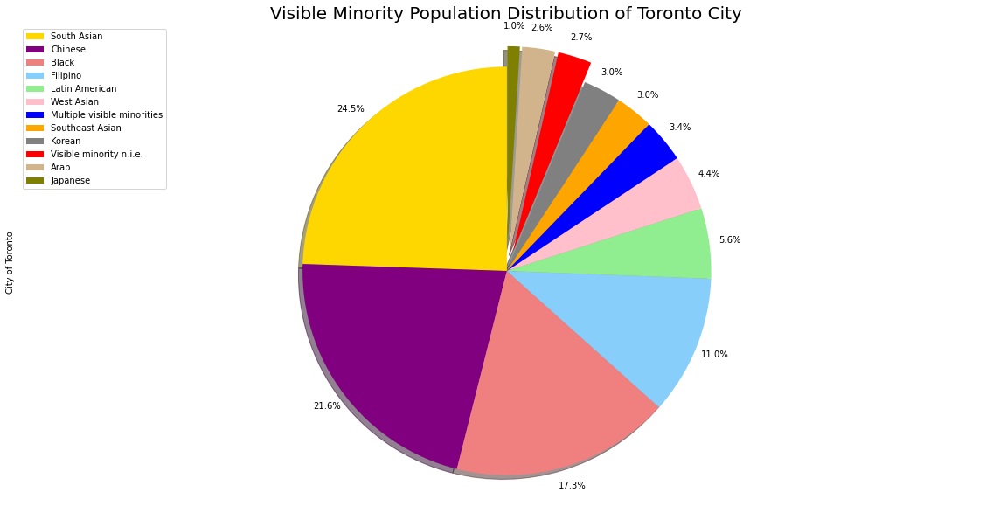

In [293]:
colors_list = ['gold', 'purple', 'lightcoral', 'lightskyblue', 'lightgreen', 'pink', 'blue', 'orange', 'gray', 'red', 'tan', 'olive']
explode_list = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0.1, 0.1, 0.1] # ratio for each continent with which to offset each wedge.

tor_minor['City of Toronto'].plot(kind='pie',
                            figsize=(20, 10),
                            autopct='%1.1f%%', 
                            startangle=90,    
                            shadow=True,       
                            labels=None,         # turn off labels on pie chart
                            pctdistance=1.1,    # the ratio between the center of each pie slice and the start of the text generated by autopct 
                            colors=colors_list,  # add custom colors
                            explode=explode_list # 'explode' lowest continents
                            )

plt.title('Visible Minority Population Distribution of Toronto City', fontsize=20)
plt.axis('equal') # Sets the pie chart to look like a circle.

# add legend
plt.legend(labels=tor_minor['City of Toronto'].index, loc='upper left') 

plt.show()

## Neighbourhoods of Higher Minority Percentage than Toronto City's Overall Minority Percentage

In [294]:
# drop Toronta City figures
hoods=total.iloc[0:,1:]
print('hoods_minor shape : {}'.format(hoods.shape))
hoods

hoods_minor shape : (13, 140)


,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,Banbury-Don Mills,Bathurst Manor,Bay Street Corridor,Bayview Village,Bayview Woods-Steeles,Bedford Park-Nortown,Beechborough-Greenbrook,Bendale,Birchcliffe-Cliffside,Black Creek,Blake-Jones,Briar Hill-Belgravia,Bridle Path-Sunnybrook-York Mills,Broadview North,Brookhaven-Amesbury,Cabbagetown-South St. James Town,Caledonia-Fairbank,Casa Loma,Centennial Scarborough,Church-Yonge Corridor,Clairlea-Birchmount,Clanton Park,Cliffcrest,Corso Italia-Davenport,Danforth,Danforth East York,Don Valley Village,Dorset Park,Dovercourt-Wallace Emerson-Junction,Downsview-Roding-CFB,Dufferin Grove,East End-Danforth,Edenbridge-Humber Valley,Eglinton East,Elms-Old Rexdale,Englemount-Lawrence,Eringate-Centennial-West Deane,Etobicoke West Mall,Flemingdon Park,Forest Hill North,Forest Hill South,Glenfield-Jane Heights,Greenwood-Coxwell,Guildwood,Henry Farm,High Park North,High Park-Swansea,Highland Creek,Hillcrest Village,Humber Heights-Westmount,Humber Summit,Humbermede,Humewood-Cedarvale,Ionview,Islington-City Centre West,Junction Area,Keelesdale-Eglinton West,Kennedy Park,Kensington-Chinatown,Kingsview Village-The Westway,Kingsway South,Lambton Baby Point,L'Amoreaux,Lansing-Westgate,Lawrence Park North,Lawrence Park South,Leaside-Bennington,Little Portugal,Long Branch,Malvern,Maple Leaf,Markland Wood,Milliken,Mimico (includes Humber Bay Shores),Morningside,Moss Park,Mount Dennis,Mount Olive-Silverstone-Jamestown,Mount Pleasant East,Mount Pleasant West,New Toronto,Newtonbrook East,Newtonbrook West,Niagara,North Riverdale,North St. James Town,Oakridge,Oakwood Village,O'Connor-Parkview,Old East York,Palmerston-Little Italy,Parkwoods-Donalda,Pelmo Park-Humberlea,Playter Estates-Danforth,Pleasant View,Princess-Rosethorn,Regent Park,Rexdale-Kipling,Rockcliffe-Smythe,Roncesvalles,Rosedale-Moore Park,Rouge,Runnymede-Bloor West Village,Rustic,Scarborough Village,South Parkdale,South Riverdale,St.Andrew-Windfields,Steeles,Stonegate-Queensway,Tam O'Shanter-Sullivan,Taylor-Massey,The Beaches,Thistletown-Beaumond Heights,Thorncliffe Park,Trinity-Bellwoods,University,Victoria Village,Waterfront Communities-The Island,West Hill,West Humber-Clairville,Westminster-Branson,Weston,Weston-Pelham Park,Wexford/Maryvale,Willowdale East,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
Characteristic,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Latin American,170,230,180,405,350,575,460,410,150,345,335,530,225,1780,80,920,65,250,1880,260,825,225,115,695,375,255,135,1135,85,300,550,270,1510,3605,490,275,675,400,765,550,400,445,390,420,140,3680,205,120,365,690,475,205,220,485,895,1830,530,225,1330,490,910,250,315,980,55,150,415,240,100,110,140,455,255,770,645,135,35,985,345,395,1380,1085,285,950,290,165,360,1005,130,615,145,1325,340,110,240,1025,820,125,145,165,285,850,2200,290,270,495,120,735,280,515,310,305,30,400,360,215,215,660,305,190,120,430,1405,555,1300,450,1390,780,600,825,190,935,745,140,155,445,220,160,1765,710
South Asian,5315,4190,540,1125,2825,550,2420,1360,670,455,330,8305,1405,2110,445,410,375,630,1190,525,230,360,2475,2510,6140,400,3000,325,705,1030,2890,7245,2105,1380,665,1700,390,6490,840,365,1275,1165,7650,170,245,2150,1070,815,3365,950,800,4515,1525,325,3590,3275,320,3730,3525,525,915,4165,760,3630,205,270,7240,1005,355,315,450,445,330,17465,985,230,3080,1865,5155,1315,510,11095,680,1895,590,745,1025,2210,405,3770,4800,625,1730,295,395,3610,750,240,1310,590,2770,1420,990,835,605,20175,245,420,5520,1830,1170,1075,1560,925,4690,5975,645,2555,9845,280,395,2985,6735,5060,13920,720,765,410,4195,3375,860,2340,21545,610,345,255,445,560,4180,865
Chinese,16460,11110,275,2145,4630,655,7435,5860,4360,1030,110,4400,1190,765,950,260,1410,470,450,720,235,420,710,3835,2120,500,765,445,820,153

In [295]:
# turn numbers into percentages
hoods_per = pd.DataFrame()
hoods_per = pd.concat([hoods_per, char], axis=1)
for idy, hood in enumerate(hoods.columns.values.tolist()):
    percent_col=[]
    hood_tot=hoods.iloc[:,idy].sum()
    #print(hoods_minor.iloc[:,idy].tolist())
    for idx, qty in enumerate(hoods.iloc[:,idy].tolist()):
        percent_col.append(round(qty/hood_tot*100, 2))
    #print('{} hood_tot : {} {}'.format(idy, hood_tot, percent_col))
    percent_df = pd.DataFrame(percent_col, columns=[hood])
    hoods_per = pd.concat([hoods_per, percent_df], axis=1)
hoods_per.set_index('Characteristic', inplace=True)
hoods_per

,Agincourt North,Agincourt South-Malvern West,Alderwood,Annex,Banbury-Don Mills,Bathurst Manor,Bay Street Corridor,Bayview Village,Bayview Woods-Steeles,Bedford Park-Nortown,Beechborough-Greenbrook,Bendale,Birchcliffe-Cliffside,Black Creek,Blake-Jones,Briar Hill-Belgravia,Bridle Path-Sunnybrook-York Mills,Broadview North,Brookhaven-Amesbury,Cabbagetown-South St. James Town,Caledonia-Fairbank,Casa Loma,Centennial Scarborough,Church-Yonge Corridor,Clairlea-Birchmount,Clanton Park,Cliffcrest,Corso Italia-Davenport,Danforth,Danforth East York,Don Valley Village,Dorset Park,Dovercourt-Wallace Emerson-Junction,Downsview-Roding-CFB,Dufferin Grove,East End-Danforth,Edenbridge-Humber Valley,Eglinton East,Elms-Old Rexdale,Englemount-Lawrence,Eringate-Centennial-West Deane,Etobicoke West Mall,Flemingdon Park,Forest Hill North,Forest Hill South,Glenfield-Jane Heights,Greenwood-Coxwell,Guildwood,Henry Farm,High Park North,High Park-Swansea,Highland Creek,Hillcrest Village,Humber Heights-Westmount,Humber Summit,Humbermede,Humewood-Cedarvale,Ionview,Islington-City Centre West,Junction Area,Keelesdale-Eglinton West,Kennedy Park,Kensington-Chinatown,Kingsview Village-The Westway,Kingsway South,Lambton Baby Point,L'Amoreaux,Lansing-Westgate,Lawrence Park North,Lawrence Park South,Leaside-Bennington,Little Portugal,Long Branch,Malvern,Maple Leaf,Markland Wood,Milliken,Mimico (includes Humber Bay Shores),Morningside,Moss Park,Mount Dennis,Mount Olive-Silverstone-Jamestown,Mount Pleasant East,Mount Pleasant West,New Toronto,Newtonbrook East,Newtonbrook West,Niagara,North Riverdale,North St. James Town,Oakridge,Oakwood Village,O'Connor-Parkview,Old East York,Palmerston-Little Italy,Parkwoods-Donalda,Pelmo Park-Humberlea,Playter Estates-Danforth,Pleasant View,Princess-Rosethorn,Regent Park,Rexdale-Kipling,Rockcliffe-Smythe,Roncesvalles,Rosedale-Moore Park,Rouge,Runnymede-Bloor West Village,Rustic,Scarborough Village,South Parkdale,South Riverdale,St.Andrew-Windfields,Steeles,Stonegate-Queensway,Tam O'Shanter-Sullivan,Taylor-Massey,The Beaches,Thistletown-Beaumond Heights,Thorncliffe Park,Trinity-Bellwoods,University,Victoria Village,Waterfront Communities-The Island,West Hill,West Humber-Clairville,Westminster-Branson,Weston,Weston-Pelham Park,Wexford/Maryvale,Willowdale East,Willowdale West,Willowridge-Martingrove-Richview,Woburn,Woodbine Corridor,Woodbine-Lumsden,Wychwood,Yonge-Eglinton,Yonge-St.Clair,York University Heights,Yorkdale-Glen Park
Characteristic,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Latin American,0.59,0.98,1.50,1.41,1.30,3.69,1.80,1.94,1.19,1.49,5.24,1.82,1.04,8.25,1.04,6.48,0.71,2.21,10.62,2.37,8.33,2.06,0.86,2.29,1.43,1.55,0.85,8.05,0.89,1.76,2.05,1.11,4.17,10.30,4.18,1.31,4.44,1.80,8.09,2.51,2.16,3.88,1.78,3.32,1.32,12.17,1.43,1.24,2.32,3.16,2.03,1.65,1.30,4.79,7.21,11.78,3.73,1.65,3.07,3.48,8.24,1.46,1.81,4.46,0.60,1.88,0.95,1.50,0.69,0.73,0.84,3.02,2.54,1.76,6.54,1.29,0.13,2.96,2.01,2.14,10.40,3.30,1.70,3.29,2.57,1.06,1.52,3.30,1.11,3.35,1.07,6.32,1.84,1.19,1.74,2.95,7.67,1.64,0.92,1.49,2.67,8.21,9.90,1.95,1.31,1.07,1.19,7.55,1.70,2.49,1.15,1.73,0.12,1.61,1.33,1.39,1.00,6.51,1.46,1.17,1.80,2.50,2.14,2.06,3.95,1.72,7.86,7.02,2.18,1.64,1.14,4.22,1.41,1.13,1.97,3.36,1.86,1.30,6.40,5.07
South Asian,18.43,17.87,4.49,3.93,10.46,3.53,9.45,6.43,5.29,1.97,5.16,28.57,6.48,9.78,5.79,2.89,4.08,5.56,6.72,4.79,2.32,3.30,18.53,8.29,23.35,2.43,18.98,2.31,7.35,6.03,10.78,29.71,5.81,3.94,5.68,8.10,2.56,29.15,8.88,1.67,6.90,10.15,34.90,1.34,2.31,7.11,7.44,8.44,21.40,4.35,3.42,36.25,9.01,3.21,28.92,21.07,2.25,27.36,8.15,3.73,8.28,24.35,4.36,16.53,2.24,3.38,16.64,6.26,2.43,2.08,2.70,2.95,3.28,39.91,9.99,2.20,11.81,5.60,30.08,7.13,3.84,33.79,4.06,6.55,5.22,4.80,4.34,7.26,3.47,20.54,35.26,2.98,9.36,3.20,2.87,10.39,7.02,3.14,8.30,5.34,25.97,13.71,4.46,5.61,2.93,43.80,2.44,4.31,33.57,8.86,4.33,6.09,6.43,3.71,17.35,38.59,3.01,25.20,47.23,1.73,5.92,17.36,

In [296]:
# shortlist neighbourhoods of higher minority percentage than Toronto City's overall minority percentage
minor_per = hoods_per.transpose()
minor_per.index.name='Neighbourhood'

high_minor=minor_per[minor_per['Not a visible minority'] < native_per]
print('{} neighbourhoods has higher minority percentage than Toronto City overall minority percentage {}%'.format(high_minor.shape[0], (100-native_per)))
high_minor.head()

57 neighbourhoods has higher minority percentage than Toronto City overall minority percentage 51.49%


Characteristic,Latin American,South Asian,Chinese,Black,Filipino,Arab,Southeast Asian,West Asian,Korean,Japanese,Visible minority n.i.e.,Multiple visible minorities,Not a visible minority
Neighbourhood,,,,,,,,,,,,,
Agincourt North,0.59,18.43,57.08,4.65,4.92,0.95,0.90,0.43,0.24,0.21,0.85,2.18,8.55
Agincourt South-Malvern West,0.98,17.87,47.38,6.59,5.46,1.28,0.66,1.60,0.60,0.17,1.17,2.09,14.16
Bay Street Corridor,1.80,9.45,29.03,3.03,1.48,5.12,1.33,2.40,5.23,1.31,0.61,1.44,37.78
Bayview Village,1.94,6.43,27.71,3.57,3.62,1.68,0.95,11.54,7.83,0.85,0.50,2.01,31.38
Bayview Woods-Steeles,1.19,5.29,34.45,4.19,1.38,1.03,1.07,8.02,5.61,0.55,0.36,2.05,34.81


In [297]:
# find the biggest group in these neighbourhoods
high_minor_hood = pd.DataFrame(high_minor.index.values.tolist(), columns=['Neighbourhood'])
top = pd.DataFrame(high_minor.idxmax(axis=1).tolist(), columns=['Top minority'])
high_minor_hood = pd.concat([high_minor_hood, top], axis=1)
top = pd.DataFrame(high_minor.max(axis=1).tolist(), columns=['Percent'])
high_minor_hood = pd.concat([high_minor_hood, top], axis=1)
print('{} neighbourhoods has higher minority percentage than the Toronto City average {}%'.format(high_minor.shape[0], (100-native_per)))
print('In {} out of the {} neighboorhoods, the biggest ethnic group is not the aboriginals.'.format(high_minor_hood[high_minor_hood['Top minority']!='Not a visible minority'].shape[0], high_minor.shape[0]))

minor_df=high_minor_hood[high_minor_hood['Top minority']!='Not a visible minority'].join(hood_dist.set_index('Neighbourhood'), on='Neighbourhood')
chinese_df=high_minor_hood[high_minor_hood['Top minority']=='Chinese'].join(hood_dist.set_index('Neighbourhood'), on='Neighbourhood')
sa_df=high_minor_hood[high_minor_hood['Top minority']=='South Asian'].join(hood_dist.set_index('Neighbourhood'), on='Neighbourhood')
black_df=high_minor_hood[high_minor_hood['Top minority']=='Black'].join(hood_dist.set_index('Neighbourhood'), on='Neighbourhood')
print('Black dominates residency in {} neighbourhoods'.format(black_df.shape[0]))
print('Chinese dominates residency in {} neighbourhoods'.format(chinese_df.shape[0]))
print('South Asian dominates residency in {} neighbourhoods'.format(sa_df.shape[0]))

minor_df.sort_values(by=['Top minority'],ascending=True)

57 neighbourhoods has higher minority percentage than the Toronto City average 51.49%
In 28 out of the 57 neighboorhoods, the biggest ethnic group is not the aboriginals.
Black dominates residency in 3 neighbourhoods
Chinese dominates residency in 9 neighbourhoods
South Asian dominates residency in 16 neighbourhoods


,Neighbourhood,Top minority,Percent,Hood_ID,MLS_District
7,Black Creek,Black,29.26,24,Toronto W05
30,Mount Dennis,Black,32.86,115,Toronto W04
16,Glenfield-Jane Heights,Black,24.34,25,Toronto W05
0,Agincourt North,Chinese,57.08,129,Toronto E07
44,Tam O'Shanter-Sullivan,Chinese,32.06,118,Toronto E05
43,Steeles,Chinese,73.14,116,Toronto E05
32,Newtonbrook East,Chinese,31.10,50,Toronto C11
53,Willowdale East,Chinese,33.78,51,Toronto C14
26,L'Amoreaux,Chinese,37.15,117,Toronto E05
28,Milliken,Chinese,71.77,130,Toronto E07


## Illustrate Non-natives Dominated Neighbourhoods 

In [358]:
# Import geo files
black_geo=r'black.geojson'
chinese_geo=r'chinese.geojson'
sa_geo=r'sa.geojson'

# Create choropleth map 
minor_map = folium.Map(location=[latitude, longitude], zoom_start=11, tiles='Stamen Toner')#'Stamen Toner')
minor_map.choropleth(
    geo_data=black_geo,
    data=black_df,
    columns=['Hood_ID', 'Percent'],
    key_on='feature.properties.AREA_SHORT_CODE',
    #threshold_scale=threshold_scale,
    fill_color='OrRd', 
    fill_opacity=0.6, 
    line_opacity=0.2,
    legend_name='Black-dominated Neighbourhoods (population in %)',
    reset=True
)
minor_map.choropleth(
    geo_data=chinese_geo,
    data=chinese_df,
    columns=['Hood_ID', 'Percent'],
    key_on='feature.properties.AREA_SHORT_CODE',
    #threshold_scale=threshold_scale,
    fill_color='YlGn', 
    fill_opacity=0.6, 
    line_opacity=0.2,
    legend_name='Chinese-dominated Neighbourhoods (population in %)',
    reset=True
)

minor_map.choropleth(
    geo_data=sa_geo,
    data=sa_df,
    columns=['Hood_ID', 'Percent'],
    key_on='feature.properties.AREA_SHORT_CODE',
    #threshold_scale=threshold_scale,
    fill_color='BuPu', 
    fill_opacity=0.6, 
    line_opacity=0.2,
    legend_name='South Asian-dominated Neighbourhoods (population in %)',
    reset=True
)

minor_map

## See where the biggest minority groups live in

In [299]:
max=[]
for idx, minor in enumerate(minor_per.columns.values.tolist()):
    max.append([minor, minor_per.iloc[:,idx].idxmax(), minor_per.iloc[:,idx].max()])
    #print('{} hood_tot : {} '.format(idx, max))
minor_max = pd.DataFrame(max, columns=['Characteristic', 'Neighbourhood', 'Max_Percent'])
minor_max

,Characteristic,Neighbourhood,Max_Percent
0,Latin American,Glenfield-Jane Heights,12.17
1,South Asian,Thorncliffe Park,47.23
2,Chinese,Steeles,73.14
3,Black,Rustic,35.47
4,Filipino,Westminster-Branson,22.94
5,Arab,Mount Olive-Silverstone-Jamestown,8.07
6,Southeast Asian,Glenfield-Jane Heights,13.18
7,West Asian,Newtonbrook East,14.94
8,Korean,Newtonbrook East,12.36
9,Japanese,Playter Estates-Danforth,1.70


In [300]:
chinese = minor_per[['Chinese']].sort_values(by=['Chinese'],ascending=False)
chinese[chinese['Chinese']>30]

Characteristic,Chinese
Neighbourhood,
Steeles,73.14
Milliken,71.77
Agincourt North,57.08
Hillcrest Village,48.61
Agincourt South-Malvern West,47.38
L'Amoreaux,37.15
Pleasant View,35.67
Kensington-Chinatown,34.82
Bayview Woods-Steeles,34.45


In [301]:
sa = minor_per[['South Asian']].sort_values(by=['South Asian'],ascending=False)
sa[sa['South Asian']>30]

Characteristic,South Asian
Neighbourhood,
Thorncliffe Park,47.23
Rouge,43.80
West Humber-Clairville,42.34
Woburn,40.65
Malvern,39.91
Taylor-Massey,38.59
Highland Creek,36.25
Oakridge,35.26
Flemingdon Park,34.90


In [348]:
latin = minor_per[['Black']].sort_values(by=['Black'],ascending=False)
latin[latin['Black']>30]

Characteristic,Black
Neighbourhood,
Rustic,35.47
Weston,34.20
Mount Dennis,32.86
Beechborough-Greenbrook,32.39
Elms-Old Rexdale,30.97


## Pin Neighbourhood Cluster and Crime Rates on Choropleth Maps

In [359]:
# create map
minor_cluster_map = minor_map
minor_cluster_map.add_child(cluster_feature)

In [360]:
# create map
price_cluster_map = hp_tmap
price_cluster_map.add_child(cluster_feature)

In [361]:
price_cluster_crime_map = hp_tmap
price_cluster_crime_map.add_child(crime_feature)

In [365]:
minor_cluster_crime_map = minor_map
minor_cluster_crime_map.add_child(crime_feature)